In [1]:
%env CUDA_VISIBLE_DEVICES=-1
import torch
import numpy as np
import pickle
import pylab as plt
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, f1_score

import pytorch_lightning as pl
from dataset import BraTS2dDataset
from models import BraTSClassifierBinary, BraTSClassifierHuber
from igs import train_sampling_pattern_1d, test_sampling_pattern, EquispacedMaskFunc

env: CUDA_VISIBLE_DEVICES=-1


In [2]:
fig_bezzeless = lambda nc, nr : plt.subplots(ncols=nc, nrows=nr, figsize=(4 * nc, 4), dpi=120, 
                                             subplot_kw=dict(frameon=False, xticks=[], yticks=[]), 
                                             gridspec_kw=dict(wspace=0.0, hspace=0.0))

In [3]:
def test_model(model, val_generator):
    yt = []
    yp = []
    for batch in val_generator:
        with torch.no_grad():
            pred = model.predict({k:v.cuda() for k,v in batch.items()})
        yt += batch['target'].float().numpy().tolist()
        yp += pred.float().cpu().numpy().tolist()
    return yt, yp

In [4]:
np.random.seed(42)
torch.manual_seed(42)

with open('train.cache', 'rb') as f:
    train_slices = pickle.load(f)
with open('val.cache', 'rb') as f:
    val_slices = pickle.load(f)

train_dataset = BraTS2dDataset('/home/a_razumov/small_datasets/brats_h5/train.h5', slices=train_slices)
val_dataset = BraTS2dDataset('/home/a_razumov/small_datasets/brats_h5/val.h5', slices=val_slices)

In [5]:
train_generator = torch.utils.data.DataLoader(train_dataset, batch_size=128, shuffle=True, num_workers=16)
val_generator = torch.utils.data.DataLoader(val_dataset, batch_size=128, shuffle=False, num_workers=16)

In [22]:
from collections import Counter
from tqdm import tqdm

counter = Counter()

for b in tqdm(train_dataset):
    key = 'yes' if b['target'].item() else 'no'
    counter[key] += 1
print(counter)

100%|██████████| 35508/35508 [11:07<00:00, 53.19it/s]

Counter({'no': 18227, 'yes': 17281})


# Train models

In [ ]:
model = BraTSClassifierBinary()

logger = pl.loggers.TensorBoardLogger(save_dir=f'logs', name='BraTSClassifierBinary')

checkpoint_callback = pl.callbacks.ModelCheckpoint(
    monitor='val_loss',
    dirpath=f'logs/BraTSClassifierBinary',
    filename='{epoch:02d}-{val_loss:.3f}',
    mode='min')

trainer = pl.Trainer(gpus=1, max_epochs=10, logger=logger, callbacks=[checkpoint_callback])
trainer.fit(model, train_generator, val_generator)

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]

  | Name | Type   | Params
--------------------------------
0 | net  | ResNet | 11.2 M


Validation sanity check: 0it [00:00, ?it/s]

Exception ignored in: <function _releaseLock at 0x7f71b205a310>
Traceback (most recent call last):
  File "/home/a_razumov/miniconda3/envs/k-space-mri-p38/lib/python3.8/logging/__init__.py", line 223, in _releaseLock
    def _releaseLock():
KeyboardInterrupt: 


In [ ]:
model = BraTSClassifierHuber()

logger = pl.loggers.TensorBoardLogger(save_dir=f'logs', name='BraTSClassifierHuber')

checkpoint_callback = pl.callbacks.ModelCheckpoint(
    monitor='val_loss',
    dirpath=f'logs/BraTSClassifierHuber',
    filename='{epoch:02d}-{val_loss:.3f}',
    mode='min')

trainer = pl.Trainer(gpus=1, max_epochs=10, logger=logger, callbacks=[checkpoint_callback])
trainer.fit(model, train_generator, val_generator)

# Load and test models

In [5]:
model = BraTSClassifierBinary.load_from_checkpoint(
    'logs/BraTSClassifierBinary/epoch=03-val_loss=0.238.ckpt', strict=False).eval().cuda()
yt, yp = test_model(model, val_generator)
print('acc: ', accuracy_score(yt, yp), 'f1: ', f1_score(yt, yp))

acc:  0.9091027223702164 f1:  0.8942954287873064


In [6]:
model = BraTSClassifierHuber.load_from_checkpoint(
    'logs/BraTSClassifierHuber/epoch=03-val_loss=0.216.ckpt', strict=False).eval().cuda()
yt, yp = test_model(model, val_generator)
print('acc: ', accuracy_score(yt, yp), 'f1: ', f1_score(yt, yp))

acc:  0.9132609966863752 f1:  0.9043353636689359


# Train sampling mask

In [9]:
from torch.nn.functional import soft_margin_loss, cross_entropy
model = BraTSClassifierBinary.load_from_checkpoint(
    'logs/BraTSClassifierBinary/epoch=03-val_loss=0.238.ckpt', strict=False).eval().cuda()
loss_fn = lambda inputs, targets : cross_entropy(inputs, targets)
w_list = train_sampling_pattern_1d(train_generator, model.net, loss_fn, batch_size=len(train_generator))
torch.save(w_list, 'samplings_bce.pt')

  0%|          | 0/278 [00:00<?, ?it/s]

select: 117, loss: 3.335311
select: 124, loss: 3.335311
select: 124, loss: 3.335311
select: 124, loss: 3.335311


  0%|          | 0/278 [00:00<?, ?it/s]

select: 116, loss: 2.695804
select: 116, loss: 2.695804
select: 121, loss: 2.695804
select: 116, loss: 2.695804


  0%|          | 0/278 [00:00<?, ?it/s]

select: 124, loss: 1.872675
select: 121, loss: 1.872675
select: 119, loss: 1.872675
select: 119, loss: 1.872675


  0%|          | 0/278 [00:00<?, ?it/s]

select: 125, loss: 0.777525
select: 117, loss: 0.777525
select: 123, loss: 0.777525
select: 123, loss: 0.777525


  0%|          | 0/278 [00:00<?, ?it/s]

select: 121, loss: 0.314159
select: 119, loss: 0.314159
select: 118, loss: 0.314159
select: 121, loss: 0.314159


  0%|          | 0/278 [00:00<?, ?it/s]

select: 119, loss: 0.359613
select: 123, loss: 0.359613
select: 117, loss: 0.359613
select: 117, loss: 0.359613


  0%|          | 0/278 [00:00<?, ?it/s]

select: 123, loss: 0.328013
select: 128, loss: 0.328013
select: 122, loss: 0.328013
select: 128, loss: 0.328013


  0%|          | 0/278 [00:00<?, ?it/s]

select: 113, loss: 0.383576
select: 126, loss: 0.383576
select: 115, loss: 0.383576
select: 122, loss: 0.383576


  0%|          | 0/278 [00:00<?, ?it/s]

select: 118, loss: 0.249117
select: 127, loss: 0.249117
select: 127, loss: 0.249117
select: 127, loss: 0.249117


  0%|          | 0/278 [00:00<?, ?it/s]

select: 127, loss: 0.150095
select: 122, loss: 0.150095
select: 125, loss: 0.150095
select: 118, loss: 0.150095


  0%|          | 0/278 [00:00<?, ?it/s]

select: 122, loss: 0.290054
select: 130, loss: 0.290054
select: 129, loss: 0.290054
select: 126, loss: 0.290054


  0%|          | 0/278 [00:00<?, ?it/s]

select: 126, loss: 0.299230
select: 110, loss: 0.299230
select: 130, loss: 0.299230
select: 125, loss: 0.299230


  0%|          | 0/278 [00:00<?, ?it/s]

select: 115, loss: 0.350477
select: 129, loss: 0.350477
select: 111, loss: 0.350477
select: 129, loss: 0.350477


  0%|          | 0/278 [00:00<?, ?it/s]

select: 128, loss: 0.257744
select: 125, loss: 0.257744
select: 116, loss: 0.257744
select: 115, loss: 0.257744


  0%|          | 0/278 [00:00<?, ?it/s]

select: 114, loss: 0.143175
select: 109, loss: 0.143175
select: 110, loss: 0.143175
select: 130, loss: 0.143175


  0%|          | 0/278 [00:00<?, ?it/s]

select: 111, loss: 0.152870
select: 114, loss: 0.152870
select: 126, loss: 0.152870
select: 114, loss: 0.152870


  0%|          | 0/278 [00:00<?, ?it/s]

select: 112, loss: 0.106609
select: 108, loss: 0.106609
select: 128, loss: 0.106609
select: 108, loss: 0.106609


In [10]:
model = BraTSClassifierHuber.load_from_checkpoint(
    'logs/BraTSClassifierHuber/epoch=03-val_loss=0.216.ckpt', strict=False).eval().cuda()
loss_fn = lambda inputs, targets : soft_margin_loss(inputs.flatten(), targets.float() * 2 - 1)
w_list = train_sampling_pattern_1d(train_generator, model.net, loss_fn, batch_size=len(train_generator))
torch.save(w_list, 'samplings_huber.pt')

  0%|          | 0/278 [00:00<?, ?it/s]

select: 117, loss: 3.192357
select: 118, loss: 3.192357
select: 122, loss: 3.192357
select: 116, loss: 3.192357


  0%|          | 0/278 [00:00<?, ?it/s]

select: 123, loss: 1.862662
select: 122, loss: 1.862662
select: 127, loss: 1.862662
select: 122, loss: 1.862662


  0%|          | 0/278 [00:00<?, ?it/s]

select: 122, loss: 1.105201
select: 121, loss: 1.105201
select: 121, loss: 1.105201
select: 121, loss: 1.105201


  0%|          | 0/278 [00:00<?, ?it/s]

select: 121, loss: 0.446274
select: 119, loss: 0.446274
select: 119, loss: 0.446274
select: 118, loss: 0.446274


  0%|          | 0/278 [00:00<?, ?it/s]

select: 119, loss: 0.628762
select: 116, loss: 0.628762
select: 124, loss: 0.628762
select: 124, loss: 0.628762


  0%|          | 0/278 [00:00<?, ?it/s]

select: 118, loss: 0.529323
select: 117, loss: 0.529323
select: 123, loss: 0.529323
select: 123, loss: 0.529323


  0%|          | 0/278 [00:00<?, ?it/s]

select: 124, loss: 0.391731
select: 126, loss: 0.391731
select: 128, loss: 0.391731
select: 119, loss: 0.391731


  0%|          | 0/278 [00:00<?, ?it/s]

select: 116, loss: 0.411178
select: 114, loss: 0.411178
select: 117, loss: 0.411178
select: 117, loss: 0.411178


  0%|          | 0/278 [00:00<?, ?it/s]

select: 107, loss: 0.272692
select: 115, loss: 0.272692
select: 126, loss: 0.272692
select: 126, loss: 0.272692


  0%|          | 0/278 [00:00<?, ?it/s]

select: 126, loss: 0.160235
select: 112, loss: 0.160235
select: 111, loss: 0.160235
select: 129, loss: 0.160235


  0%|          | 0/278 [00:00<?, ?it/s]

select: 113, loss: 0.261234
select: 125, loss: 0.261234
select: 115, loss: 0.261234
select: 125, loss: 0.261234


  0%|          | 0/278 [00:00<?, ?it/s]

select: 115, loss: 0.156702
select: 128, loss: 0.156702
select: 113, loss: 0.156702
select: 127, loss: 0.156702


  0%|          | 0/278 [00:00<?, ?it/s]

select: 125, loss: 0.115219
select: 111, loss: 0.115219
select: 129, loss: 0.115219
select: 130, loss: 0.115219


  0%|          | 0/278 [00:00<?, ?it/s]

select: 127, loss: 0.143526
select: 123, loss: 0.143526
select: 116, loss: 0.143526
select: 128, loss: 0.143526


  0%|          | 0/278 [00:00<?, ?it/s]

select: 128, loss: 0.128875
select: 129, loss: 0.128875
select: 118, loss: 0.128875
select: 110, loss: 0.128875


  0%|          | 0/278 [00:00<?, ?it/s]

select: 130, loss: 0.216209
select: 127, loss: 0.216209
select: 114, loss: 0.216209
select: 114, loss: 0.216209


  0%|          | 0/278 [00:00<?, ?it/s]

select: 114, loss: 0.226400
select: 130, loss: 0.226400
select: 110, loss: 0.226400
select: 133, loss: 0.226400


# Test sampling mask

In [6]:
w_list_bce = torch.load('samplings_bce.pt')[-3]
w_list_huber = torch.load('samplings_huber.pt')[-3]

In [7]:
w_list_bce[0].sum(), w_list_huber[0].sum()

(tensor(16., device='cuda:0'), tensor(16., device='cuda:0'))

In [8]:
fastmri_mask = torch.tensor(
    EquispacedMaskFunc([0.05], [15])((240, 240))[0]
).cuda().float().unsqueeze(1).unsqueeze(0).unsqueeze(0)

zm = torch.zeros(240).cuda().float()
zm[240//2 - int(16)//2 : 240//2 + int(16)//2] = 1
zm = zm.unsqueeze(1).unsqueeze(0).unsqueeze(0)

fm = torch.ones(240).cuda().float()

In [9]:
fastmri_mask.sum(), zm.sum()

(tensor(16., device='cuda:0'), tensor(16., device='cuda:0'))

In [11]:
model = BraTSClassifierBinary.load_from_checkpoint(
    'logs/BraTSClassifierBinary/epoch=03-val_loss=0.238.ckpt', strict=False).eval().cuda()

for name, sampling in [
    ('fastmri', fastmri_mask),
    ('center', zm),
    ('ours', w_list_bce.unsqueeze(0).unsqueeze(3)),
    ('full', fm)
]:
    model.sampling = sampling
    model.use_sampling = True
    yt, yp = test_model(model, val_generator)
    print(name, '\n\tacc: ', accuracy_score(yt, yp), 'f1: ', f1_score(yt, yp))

fastmri 
	acc:  0.8612825677343903 f1:  0.8530322847112274
center 
	acc:  0.8701838736924177 f1:  0.862358776522458
ours 
	acc:  0.886102267558963 f1:  0.8715091988565565
full 
	acc:  0.9091027223702164 f1:  0.8942954287873064


In [12]:
model = BraTSClassifierHuber.load_from_checkpoint(
    'logs/BraTSClassifierHuber/epoch=03-val_loss=0.216.ckpt', strict=False).eval().cuda()

for name, sampling in [
    ('fastmri', fastmri_mask),
    ('center', zm),
    ('ours', w_list_huber.unsqueeze(0).unsqueeze(3)),
    ('full', fm)
]:
    model.sampling = sampling
    model.use_sampling = True
    yt, yp = test_model(model, val_generator)
    print(name, '\n\tacc: ', accuracy_score(yt, yp), 'f1: ', f1_score(yt, yp))

fastmri 
	acc:  0.8302254564355792 f1:  0.8352978254018281
center 
	acc:  0.8478981222792541 f1:  0.8483710084850056
ours 
	acc:  0.8823338314599442 f1:  0.8744018309175393
full 
	acc:  0.9132609966863752 f1:  0.9043353636689359


# 5-fold cross-val Binary

In [ ]:
from collections import defaultdict
from torch.nn.functional import soft_margin_loss, cross_entropy
from sklearn.model_selection import KFold

fold_scores = defaultdict(dict)

def get_scores(model, sampling, val_gen):
    model.sampling = sampling
    model.use_sampling = True
    yt, yp = test_model(model, val_generator)
    return accuracy_score(yt, yp), f1_score(yt, yp)

model = BraTSClassifierBinary.load_from_checkpoint('logs/BraTSClassifierBinary/epoch=03-val_loss=0.238.ckpt', strict=False).eval().cuda()
loss_fn = lambda inputs, targets : cross_entropy(inputs, targets)

for i, (train_id, val_id) in enumerate(KFold(shuffle=False).split(range(len(train_dataset)))):
    td = torch.utils.data.Subset(train_dataset, train_id)
    vd = torch.utils.data.Subset(train_dataset, val_id)
    tg = torch.utils.data.DataLoader(td, batch_size=128, shuffle=True, num_workers=16)
    vg = torch.utils.data.DataLoader(vd, batch_size=128, shuffle=True, num_workers=16)
    w_list = train_sampling_pattern_1d(tg, model.net, loss_fn, batch_size=len(tg))
    
    fold_scores[i] = dict(
        fastmri=get_scores(model, fastmri_mask, vg),
        center=get_scores(model, zm, vg),
        ours=get_scores(model, w_list[-3].unsqueeze(0).unsqueeze(3), vg),
        full=get_scores(model, fm, vg)
    )
    
with open('fold_scores_x16.pkl', mode='wb') as f: 
    pickle.dump(fold_scores, f)

  0%|          | 0/222 [00:00<?, ?it/s]

select: 123, loss: 3.288039
select: 124, loss: 3.288039
select: 124, loss: 3.288039
select: 124, loss: 3.288039


  0%|          | 0/222 [00:00<?, ?it/s]

select: 124, loss: 2.487536
select: 116, loss: 2.487536
select: 121, loss: 2.487536
select: 116, loss: 2.487536


  0%|          | 0/222 [00:00<?, ?it/s]

select: 116, loss: 1.566920
select: 121, loss: 1.566920
select: 119, loss: 1.566920
select: 119, loss: 1.566920


  0%|          | 0/222 [00:00<?, ?it/s]

select: 115, loss: 0.508994
select: 118, loss: 0.508994
select: 123, loss: 0.508994
select: 123, loss: 0.508994


  0%|          | 0/222 [00:00<?, ?it/s]

select: 119, loss: 0.538846
select: 119, loss: 0.538846
select: 118, loss: 0.538846
select: 121, loss: 0.538846


  0%|          | 0/222 [00:00<?, ?it/s]

select: 121, loss: 0.359648
select: 117, loss: 0.359648
select: 117, loss: 0.359648
select: 117, loss: 0.359648


  0%|          | 0/222 [00:00<?, ?it/s]

select: 117, loss: 0.204981
select: 127, loss: 0.204981
select: 122, loss: 0.204981
select: 127, loss: 0.204981


  0%|          | 0/222 [00:00<?, ?it/s]

select: 127, loss: 0.409719
select: 122, loss: 0.409719
select: 115, loss: 0.409719
select: 122, loss: 0.409719


  0%|          | 0/222 [00:00<?, ?it/s]

select: 122, loss: 0.243904
select: 126, loss: 0.243904
select: 116, loss: 0.243904
select: 115, loss: 0.243904


  0%|          | 0/222 [00:00<?, ?it/s]

select: 114, loss: 0.262131
select: 125, loss: 0.262131
select: 130, loss: 0.262131
select: 118, loss: 0.262131


  0%|          | 0/222 [00:00<?, ?it/s]

select: 118, loss: 0.292363
select: 128, loss: 0.292363
select: 114, loss: 0.292363
select: 114, loss: 0.292363


  0%|          | 0/222 [00:00<?, ?it/s]

select: 126, loss: 0.198220
select: 130, loss: 0.198220
select: 129, loss: 0.198220
select: 128, loss: 0.198220


  0%|          | 0/222 [00:00<?, ?it/s]

select: 113, loss: 0.200747
select: 129, loss: 0.200747
select: 125, loss: 0.200747
select: 110, loss: 0.200747


  0%|          | 0/222 [00:00<?, ?it/s]

select: 125, loss: 0.197356
select: 123, loss: 0.197356
select: 126, loss: 0.197356
select: 126, loss: 0.197356


  0%|          | 0/222 [00:00<?, ?it/s]

select: 128, loss: 0.125011
select: 111, loss: 0.125011
select: 111, loss: 0.125011
select: 111, loss: 0.125011


  0%|          | 0/222 [00:00<?, ?it/s]

select: 111, loss: 0.214546
select: 131, loss: 0.214546
select: 112, loss: 0.214546
select: 112, loss: 0.214546


  0%|          | 0/222 [00:00<?, ?it/s]

select: 112, loss: 0.139956
select: 133, loss: 0.139956
select: 110, loss: 0.139956
select: 133, loss: 0.139956


  0%|          | 0/222 [00:00<?, ?it/s]

select: 123, loss: 3.896154
select: 124, loss: 3.896154
select: 124, loss: 3.896154
select: 124, loss: 3.896154


  0%|          | 0/222 [00:00<?, ?it/s]

select: 124, loss: 2.667668
select: 116, loss: 2.667668
select: 121, loss: 2.667668
select: 116, loss: 2.667668


  0%|          | 0/222 [00:00<?, ?it/s]

select: 116, loss: 1.534533
select: 119, loss: 1.534533
select: 119, loss: 1.534533
select: 121, loss: 1.534533


  0%|          | 0/222 [00:00<?, ?it/s]

select: 115, loss: 0.773002
select: 123, loss: 0.773002
select: 123, loss: 0.773002
select: 117, loss: 0.773002


  0%|          | 0/222 [00:00<?, ?it/s]

select: 119, loss: 0.614161
select: 121, loss: 0.614161
select: 118, loss: 0.614161
select: 119, loss: 0.614161


  0%|          | 0/222 [00:00<?, ?it/s]

select: 121, loss: 0.331256
select: 117, loss: 0.331256
select: 117, loss: 0.331256
select: 123, loss: 0.331256


  0%|          | 0/222 [00:00<?, ?it/s]

select: 117, loss: 0.419847
select: 112, loss: 0.419847
select: 122, loss: 0.419847
select: 128, loss: 0.419847


  0%|          | 0/222 [00:00<?, ?it/s]

select: 127, loss: 0.294009
select: 114, loss: 0.294009
select: 115, loss: 0.294009
select: 122, loss: 0.294009


  0%|          | 0/222 [00:00<?, ?it/s]

select: 122, loss: 0.327217
select: 113, loss: 0.327217
select: 127, loss: 0.327217
select: 127, loss: 0.327217


  0%|          | 0/222 [00:00<?, ?it/s]

select: 113, loss: 0.262822
select: 118, loss: 0.262822
select: 125, loss: 0.262822
select: 118, loss: 0.262822


  0%|          | 0/222 [00:00<?, ?it/s]

select: 118, loss: 0.223858
select: 110, loss: 0.223858
select: 129, loss: 0.223858
select: 115, loss: 0.223858


  0%|          | 0/222 [00:00<?, ?it/s]

select: 125, loss: 0.297724
select: 111, loss: 0.297724
select: 111, loss: 0.297724
select: 126, loss: 0.297724


  0%|          | 0/222 [00:00<?, ?it/s]

select: 126, loss: 0.228939
select: 130, loss: 0.228939
select: 116, loss: 0.228939
select: 110, loss: 0.228939


  0%|          | 0/222 [00:00<?, ?it/s]

select: 112, loss: 0.208512
select: 115, loss: 0.208512
select: 128, loss: 0.208512
select: 125, loss: 0.208512


  0%|          | 0/222 [00:00<?, ?it/s]

select: 114, loss: 0.145904
select: 109, loss: 0.145904
select: 110, loss: 0.145904
select: 111, loss: 0.145904


  0%|          | 0/222 [00:00<?, ?it/s]

select: 128, loss: 0.192327
select: 107, loss: 0.192327
select: 126, loss: 0.192327
select: 114, loss: 0.192327


  0%|          | 0/222 [00:00<?, ?it/s]

select: 111, loss: 0.224550
select: 128, loss: 0.224550
select: 112, loss: 0.224550
select: 112, loss: 0.224550


  0%|          | 0/222 [00:00<?, ?it/s]

select: 123, loss: 3.204382
select: 116, loss: 3.204382
select: 124, loss: 3.204382
select: 124, loss: 3.204382


  0%|          | 0/222 [00:00<?, ?it/s]

select: 124, loss: 1.933202
select: 124, loss: 1.933202
select: 121, loss: 1.933202
select: 116, loss: 1.933202


  0%|          | 0/222 [00:00<?, ?it/s]

select: 116, loss: 1.242812
select: 119, loss: 1.242812
select: 119, loss: 1.242812
select: 119, loss: 1.242812


  0%|          | 0/222 [00:00<?, ?it/s]

select: 115, loss: 0.619050
select: 123, loss: 0.619050
select: 123, loss: 0.619050
select: 123, loss: 0.619050


  0%|          | 0/222 [00:00<?, ?it/s]

select: 119, loss: 0.555026
select: 121, loss: 0.555026
select: 118, loss: 0.555026
select: 121, loss: 0.555026


  0%|          | 0/222 [00:00<?, ?it/s]

select: 121, loss: 0.422284
select: 117, loss: 0.422284
select: 117, loss: 0.422284
select: 117, loss: 0.422284


  0%|          | 0/222 [00:00<?, ?it/s]

select: 117, loss: 0.377136
select: 128, loss: 0.377136
select: 122, loss: 0.377136
select: 112, loss: 0.377136


  0%|          | 0/222 [00:00<?, ?it/s]

select: 127, loss: 0.352445
select: 126, loss: 0.352445
select: 115, loss: 0.352445
select: 118, loss: 0.352445


  0%|          | 0/222 [00:00<?, ?it/s]

select: 122, loss: 0.226660
select: 127, loss: 0.226660
select: 127, loss: 0.226660
select: 113, loss: 0.226660


  0%|          | 0/222 [00:00<?, ?it/s]

select: 113, loss: 0.362552
select: 122, loss: 0.362552
select: 125, loss: 0.362552
select: 122, loss: 0.362552


  0%|          | 0/222 [00:00<?, ?it/s]

select: 118, loss: 0.179966
select: 130, loss: 0.179966
select: 114, loss: 0.179966
select: 114, loss: 0.179966


  0%|          | 0/222 [00:00<?, ?it/s]

select: 114, loss: 0.176672
select: 110, loss: 0.176672
select: 116, loss: 0.176672
select: 115, loss: 0.176672


  0%|          | 0/222 [00:00<?, ?it/s]

select: 125, loss: 0.157093
select: 129, loss: 0.157093
select: 129, loss: 0.157093
select: 130, loss: 0.157093


  0%|          | 0/222 [00:00<?, ?it/s]

select: 126, loss: 0.137558
select: 125, loss: 0.137558
select: 128, loss: 0.137558
select: 125, loss: 0.137558


  0%|          | 0/222 [00:00<?, ?it/s]

select: 112, loss: 0.103927
select: 111, loss: 0.103927
select: 126, loss: 0.103927
select: 111, loss: 0.103927


  0%|          | 0/222 [00:00<?, ?it/s]

select: 129, loss: 0.149927
select: 118, loss: 0.149927
select: 113, loss: 0.149927
select: 126, loss: 0.149927


  0%|          | 0/222 [00:00<?, ?it/s]

select: 128, loss: 0.138763
select: 132, loss: 0.138763
select: 112, loss: 0.138763
select: 131, loss: 0.138763


  0%|          | 0/222 [00:00<?, ?it/s]

select: 123, loss: 2.830202
select: 124, loss: 2.830202
select: 124, loss: 2.830202
select: 124, loss: 2.830202


  0%|          | 0/222 [00:00<?, ?it/s]

select: 124, loss: 2.095969
select: 116, loss: 2.095969
select: 121, loss: 2.095969
select: 116, loss: 2.095969


  0%|          | 0/222 [00:00<?, ?it/s]

select: 116, loss: 1.091007
select: 121, loss: 1.091007
select: 119, loss: 1.091007
select: 119, loss: 1.091007


  0%|          | 0/222 [00:00<?, ?it/s]

select: 115, loss: 0.575564
select: 117, loss: 0.575564
select: 123, loss: 0.575564
select: 123, loss: 0.575564


  0%|          | 0/222 [00:00<?, ?it/s]

select: 119, loss: 0.429329
select: 119, loss: 0.429329
select: 118, loss: 0.429329
select: 121, loss: 0.429329


  0%|          | 0/222 [00:00<?, ?it/s]

select: 121, loss: 0.480621
select: 123, loss: 0.480621
select: 117, loss: 0.480621
select: 117, loss: 0.480621


  0%|          | 0/222 [00:00<?, ?it/s]

select: 117, loss: 0.392996
select: 112, loss: 0.392996
select: 122, loss: 0.392996
select: 112, loss: 0.392996


  0%|          | 0/222 [00:00<?, ?it/s]

select: 125, loss: 0.389889
select: 114, loss: 0.389889
select: 115, loss: 0.389889
select: 118, loss: 0.389889


  0%|          | 0/222 [00:00<?, ?it/s]

select: 118, loss: 0.235485
select: 113, loss: 0.235485
select: 125, loss: 0.235485
select: 113, loss: 0.235485


  0%|          | 0/222 [00:00<?, ?it/s]

select: 127, loss: 0.369734
select: 118, loss: 0.369734
select: 130, loss: 0.369734
select: 122, loss: 0.369734


  0%|          | 0/222 [00:00<?, ?it/s]

select: 122, loss: 0.177448
select: 126, loss: 0.177448
select: 116, loss: 0.177448
select: 125, loss: 0.177448


  0%|          | 0/222 [00:00<?, ?it/s]

select: 114, loss: 0.196483
select: 110, loss: 0.196483
select: 110, loss: 0.196483
select: 130, loss: 0.196483


  0%|          | 0/222 [00:00<?, ?it/s]

select: 112, loss: 0.158596
select: 111, loss: 0.158596
select: 126, loss: 0.158596
select: 126, loss: 0.158596


  0%|          | 0/222 [00:00<?, ?it/s]

select: 126, loss: 0.261442
select: 125, loss: 0.261442
select: 111, loss: 0.261442
select: 115, loss: 0.261442


  0%|          | 0/222 [00:00<?, ?it/s]

select: 113, loss: 0.259213
select: 109, loss: 0.259213
select: 129, loss: 0.259213
select: 129, loss: 0.259213


  0%|          | 0/222 [00:00<?, ?it/s]

select: 129, loss: 0.280922
select: 122, loss: 0.280922
select: 127, loss: 0.280922
select: 127, loss: 0.280922


  0%|          | 0/222 [00:00<?, ?it/s]

select: 128, loss: 0.227763
select: 130, loss: 0.227763
select: 128, loss: 0.227763
select: 133, loss: 0.227763


  0%|          | 0/222 [00:00<?, ?it/s]

In [20]:
fold_scores[0]

{'fastmri': (0.8575791046715613, 0.8506405014990461),
 'center': (0.8701838736924177, 0.862358776522458),
 'ours': (0.8872068091741927, 0.8728950065895446),
 'full': (0.9091027223702164, 0.8942954287873064)}

In [14]:
import pandas as pd
import scipy

with open('fold_scores_x16.pkl', mode='rb') as f:
    fold_scores = pickle.load(f)

df_score = pd.DataFrame.from_dict({
    'fastmri': [fold_scores[v]['fastmri'][1] for v in fold_scores],
    'center': [fold_scores[v]['center'][1] for v in fold_scores],
    'ours': [fold_scores[v]['ours'][1] for v in fold_scores]
})
print(scipy.stats.ttest_rel(df_score.center, df_score.ours))
df_score.describe()

Ttest_relResult(statistic=-17.381609446325506, pvalue=6.43084912123907e-05)


,fastmri,center,ours
count,5.000000,5.000000,5.000000
mean,0.850641,0.862359,0.873215
std,0.000000,0.000000,0.001397
min,0.850641,0.862359,0.872208
25%,0.850641,0.862359,0.872314
50%,0.850641,0.862359,0.872895
75%,0.850641,0.862359,0.873029
max,0.850641,0.862359,0.875631


# 5-fold cross-val with finetune Binary

In [ ]:
from collections import defaultdict
from torch.nn.functional import soft_margin_loss, cross_entropy
from sklearn.model_selection import KFold

fold_scores = defaultdict(dict)

def get_scores(model, sampling, val_gen):
    model.sampling = sampling
    model.use_sampling = True
    yt, yp = test_model(model, val_generator)
    return accuracy_score(yt, yp), f1_score(yt, yp)

loss_fn = lambda inputs, targets : cross_entropy(inputs, targets)

for i, (train_id, val_id) in enumerate(KFold(shuffle=False).split(range(len(train_dataset)))):
    td = torch.utils.data.Subset(train_dataset, train_id)
    vd = torch.utils.data.Subset(train_dataset, val_id)
    tg = torch.utils.data.DataLoader(td, batch_size=128, shuffle=True, num_workers=16)
    vg = torch.utils.data.DataLoader(vd, batch_size=128, shuffle=True, num_workers=16)

    model_fastmri = BraTSClassifierBinary.load_from_checkpoint('logs/BraTSClassifierBinary/epoch=03-val_loss=0.238.ckpt', strict=False).cuda().eval()
    model_zm = BraTSClassifierBinary.load_from_checkpoint('logs/BraTSClassifierBinary/epoch=03-val_loss=0.238.ckpt', strict=False).cuda().eval()
    model_ours = BraTSClassifierBinary.load_from_checkpoint('logs/BraTSClassifierBinary/epoch=03-val_loss=0.238.ckpt', strict=False).cuda().eval()
    
    w_list = train_sampling_pattern_1d(tg, model_ours.net, loss_fn, batch_size=len(tg))
    
    model_fastmri.sampling = fastmri_mask
    model_fastmri.use_sampling = True
    model_zm.sampling = zm
    model_zm.use_sampling = True
    model_ours.sampling = w_list[-3].unsqueeze(0).unsqueeze(3)
    model_ours.use_sampling = True
    
    trainer = pl.Trainer(gpus=1, max_epochs=2)
    trainer.fit(model_fastmri, tg)
    trainer = pl.Trainer(gpus=1, max_epochs=2)
    trainer.fit(model_zm, tg)
    trainer = pl.Trainer(gpus=1, max_epochs=2)
    trainer.fit(model_ours, tg)
    
    model_fastmri = model_fastmri.eval().cuda()
    model_zm = model_zm.eval().cuda()
    model_ours = model_ours.eval().cuda()
    
    fold_scores[i] = dict(
        fastmri=get_scores(model_fastmri, fastmri_mask, vg),
        center=get_scores(model_zm, zm, vg),
        ours=get_scores(model_ours, w_list[-3].unsqueeze(0).unsqueeze(3), vg),
    )
    print(fold_scores)
    
with open('fold_scores_x16_finetune.pkl', mode='wb') as f: 
    pickle.dump(fold_scores, f)

  0%|          | 0/222 [00:00<?, ?it/s]

select: 123, loss: 3.457092
select: 124, loss: 3.457092
select: 124, loss: 3.457092
select: 124, loss: 3.457092


  0%|          | 0/222 [00:00<?, ?it/s]

select: 124, loss: 2.317807
select: 116, loss: 2.317807
select: 121, loss: 2.317807
select: 116, loss: 2.317807


  0%|          | 0/222 [00:00<?, ?it/s]

select: 116, loss: 1.294002
select: 119, loss: 1.294002
select: 119, loss: 1.294002
select: 121, loss: 1.294002


  0%|          | 0/222 [00:00<?, ?it/s]

select: 115, loss: 0.715674
select: 122, loss: 0.715674
select: 123, loss: 0.715674
select: 117, loss: 0.715674


  0%|          | 0/222 [00:00<?, ?it/s]

select: 119, loss: 0.510256
select: 121, loss: 0.510256
select: 118, loss: 0.510256
select: 119, loss: 0.510256


  0%|          | 0/222 [00:00<?, ?it/s]

select: 121, loss: 0.412112
select: 123, loss: 0.412112
select: 117, loss: 0.412112
select: 123, loss: 0.412112


  0%|          | 0/222 [00:00<?, ?it/s]

select: 117, loss: 0.358766
select: 113, loss: 0.358766
select: 122, loss: 0.358766
select: 127, loss: 0.358766


  0%|          | 0/222 [00:00<?, ?it/s]

select: 127, loss: 0.372217
select: 118, loss: 0.372217
select: 115, loss: 0.372217
select: 122, loss: 0.372217


  0%|          | 0/222 [00:00<?, ?it/s]

select: 122, loss: 0.374556
select: 114, loss: 0.374556
select: 116, loss: 0.374556
select: 115, loss: 0.374556


  0%|          | 0/222 [00:00<?, ?it/s]

select: 114, loss: 0.212499
select: 115, loss: 0.212499
select: 130, loss: 0.212499
select: 118, loss: 0.212499


  0%|          | 0/222 [00:00<?, ?it/s]

select: 118, loss: 0.327715
select: 112, loss: 0.327715
select: 114, loss: 0.327715
select: 114, loss: 0.327715


  0%|          | 0/222 [00:00<?, ?it/s]

select: 126, loss: 0.291651
select: 110, loss: 0.291651
select: 129, loss: 0.291651
select: 128, loss: 0.291651


  0%|          | 0/222 [00:00<?, ?it/s]

select: 113, loss: 0.228335
select: 111, loss: 0.228335
select: 125, loss: 0.228335
select: 110, loss: 0.228335


  0%|          | 0/222 [00:00<?, ?it/s]

select: 125, loss: 0.364051
select: 117, loss: 0.364051
select: 126, loss: 0.364051
select: 126, loss: 0.364051


  0%|          | 0/222 [00:00<?, ?it/s]

select: 128, loss: 0.171331
select: 129, loss: 0.171331
select: 111, loss: 0.171331
select: 111, loss: 0.171331


  0%|          | 0/222 [00:00<?, ?it/s]

select: 111, loss: 0.137055
select: 109, loss: 0.137055
select: 112, loss: 0.137055
select: 112, loss: 0.137055


  0%|          | 0/222 [00:00<?, ?it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
/home/a_razumov/miniconda3/envs/k-space-mri-p38/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:45: UserWarning: you defined a validation_step but have no val_dataloader. Skipping validation loop
  warnings.warn(*args, **kwargs)

  | Name | Type   | Params
--------------------------------
0 | net  | ResNet | 11.2 M


select: 112, loss: 0.176060
select: 107, loss: 0.176060
select: 110, loss: 0.176060
select: 133, loss: 0.176060


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]

  | Name | Type   | Params
--------------------------------
0 | net  | ResNet | 11.2 M


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]

  | Name | Type   | Params
--------------------------------
0 | net  | ResNet | 11.2 M


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

defaultdict(<class 'dict'>, {0: {'fastmri': (0.8652459229419791, 0.8568075117370891), 'center': (0.8901955688389318, 0.8741248324147177), 'ours': (0.9016957962445585, 0.8879010150403793)}})


  0%|          | 0/222 [00:00<?, ?it/s]

select: 123, loss: 3.436505
select: 124, loss: 3.436505
select: 124, loss: 3.436505
select: 116, loss: 3.436505


  0%|          | 0/222 [00:00<?, ?it/s]

select: 124, loss: 2.751325
select: 116, loss: 2.751325
select: 121, loss: 2.751325
select: 124, loss: 2.751325


  0%|          | 0/222 [00:00<?, ?it/s]

select: 116, loss: 1.467553
select: 119, loss: 1.467553
select: 119, loss: 1.467553
select: 119, loss: 1.467553


  0%|          | 0/222 [00:00<?, ?it/s]

select: 115, loss: 0.582264
select: 123, loss: 0.582264
select: 123, loss: 0.582264
select: 123, loss: 0.582264


  0%|          | 0/222 [00:00<?, ?it/s]

select: 119, loss: 0.557206
select: 121, loss: 0.557206
select: 118, loss: 0.557206
select: 121, loss: 0.557206


  0%|          | 0/222 [00:00<?, ?it/s]

select: 121, loss: 0.383887
select: 117, loss: 0.383887
select: 117, loss: 0.383887
select: 117, loss: 0.383887


  0%|          | 0/222 [00:00<?, ?it/s]

select: 117, loss: 0.495501
select: 128, loss: 0.495501
select: 122, loss: 0.495501
select: 128, loss: 0.495501


  0%|          | 0/222 [00:00<?, ?it/s]

select: 127, loss: 0.304316
select: 126, loss: 0.304316
select: 115, loss: 0.304316
select: 122, loss: 0.304316


  0%|          | 0/222 [00:00<?, ?it/s]

select: 122, loss: 0.285405
select: 127, loss: 0.285405
select: 127, loss: 0.285405
select: 127, loss: 0.285405


  0%|          | 0/222 [00:00<?, ?it/s]

select: 113, loss: 0.185696
select: 122, loss: 0.185696
select: 125, loss: 0.185696
select: 118, loss: 0.185696


  0%|          | 0/222 [00:00<?, ?it/s]

select: 118, loss: 0.300225
select: 130, loss: 0.300225
select: 129, loss: 0.300225
select: 115, loss: 0.300225


  0%|          | 0/222 [00:00<?, ?it/s]

select: 125, loss: 0.261999
select: 129, loss: 0.261999
select: 111, loss: 0.261999
select: 126, loss: 0.261999


  0%|          | 0/222 [00:00<?, ?it/s]

select: 126, loss: 0.236019
select: 110, loss: 0.236019
select: 116, loss: 0.236019
select: 110, loss: 0.236019


  0%|          | 0/222 [00:00<?, ?it/s]

select: 112, loss: 0.200277
select: 125, loss: 0.200277
select: 128, loss: 0.200277
select: 125, loss: 0.200277


  0%|          | 0/222 [00:00<?, ?it/s]

select: 114, loss: 0.161985
select: 131, loss: 0.161985
select: 110, loss: 0.161985
select: 111, loss: 0.161985


  0%|          | 0/222 [00:00<?, ?it/s]

select: 128, loss: 0.128568
select: 133, loss: 0.128568
select: 126, loss: 0.128568
select: 114, loss: 0.128568


  0%|          | 0/222 [00:00<?, ?it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
/home/a_razumov/miniconda3/envs/k-space-mri-p38/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:45: UserWarning: you defined a validation_step but have no val_dataloader. Skipping validation loop
  warnings.warn(*args, **kwargs)

  | Name | Type   | Params
--------------------------------
0 | net  | ResNet | 11.2 M


select: 111, loss: 0.173317
select: 112, loss: 0.173317
select: 112, loss: 0.173317
select: 112, loss: 0.173317


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]

  | Name | Type   | Params
--------------------------------
0 | net  | ResNet | 11.2 M


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]

  | Name | Type   | Params
--------------------------------
0 | net  | ResNet | 11.2 M


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

defaultdict(<class 'dict'>, {0: {'fastmri': (0.8652459229419791, 0.8568075117370891), 'center': (0.8901955688389318, 0.8741248324147177), 'ours': (0.9016957962445585, 0.8879010150403793)}, 1: {'fastmri': (0.8326944318107985, 0.8381012260295505), 'center': (0.8976024949645897, 0.8835869404638794), 'ours': (0.8985770905074394, 0.8852796354817374)}})


  0%|          | 0/222 [00:00<?, ?it/s]

In [13]:
import pandas as pd
import scipy

with open('fold_scores_x16_finetune.pkl', mode='rb') as f:
    fold_scores = pickle.load(f)

df_score = pd.DataFrame.from_dict({
    'fastmri': [fold_scores[v]['fastmri'][1] for v in fold_scores],
    'center': [fold_scores[v]['center'][1] for v in fold_scores],
    'ours': [fold_scores[v]['ours'][1] for v in fold_scores]
})
print(scipy.stats.ttest_rel(df_score.center, df_score.ours))
df_score.describe()

Ttest_relResult(statistic=-1.811063925270354, pvalue=0.14436860201301305)


,fastmri,center,ours
count,5.000000,5.000000,5.000000
mean,0.860568,0.875483,0.881029
std,0.014036,0.006666,0.005165
min,0.838101,0.865436,0.877001
25%,0.856808,0.874125,0.877448
50%,0.864177,0.875751,0.877515
75%,0.871495,0.878519,0.885280
max,0.872260,0.883587,0.887901


In [14]:
df_score

,fastmri,center,ours
0,0.856808,0.874125,0.887901
1,0.838101,0.883587,0.885280
2,0.872260,0.865436,0.877515
3,0.864177,0.878519,0.877448
4,0.871495,0.875751,0.877001


# 5-fold cross-val Huber

In [9]:
from collections import defaultdict
from torch.nn.functional import soft_margin_loss, cross_entropy
from sklearn.model_selection import KFold

fold_scores = defaultdict(dict)

def get_scores(model, sampling, val_gen):
    model.sampling = sampling
    model.use_sampling = True
    yt, yp = test_model(model, val_generator)
    return accuracy_score(yt, yp), f1_score(yt, yp)

model = BraTSClassifierHuber.load_from_checkpoint('logs/BraTSClassifierHuber/epoch=03-val_loss=0.216.ckpt', strict=False).eval().cuda()
loss_fn = lambda inputs, targets : soft_margin_loss(inputs.flatten(), targets.float() * 2 - 1)

for i, (train_id, val_id) in enumerate(KFold(shuffle=False).split(range(len(train_dataset)))):
    td = torch.utils.data.Subset(train_dataset, train_id)
    vd = torch.utils.data.Subset(train_dataset, val_id)
    tg = torch.utils.data.DataLoader(td, batch_size=128, shuffle=True, num_workers=16)
    vg = torch.utils.data.DataLoader(vd, batch_size=128, shuffle=True, num_workers=16)
    w_list = train_sampling_pattern_1d(tg, model.net, loss_fn, batch_size=len(tg))
    
    fold_scores[i] = dict(
        fastmri=get_scores(model, fastmri_mask, vg),
        center=get_scores(model, zm, vg),
        ours=get_scores(model, w_list[-3].unsqueeze(0).unsqueeze(3), vg),
        full=get_scores(model, fm, vg)
    )
    
with open('fold_scores_x16_huber.pkl', mode='wb') as f: 
    pickle.dump(fold_scores, f)

  0%|          | 0/222 [00:00<?, ?it/s]

KeyboardInterrupt: 

In [10]:
import pandas as pd
import scipy

with open('fold_scores_x16_huber.pkl', mode='rb') as f:
    fold_scores = pickle.load(f)

df_score = pd.DataFrame.from_dict({
    'fastmri': [fold_scores[v]['fastmri'][1] for v in fold_scores],
    'center': [fold_scores[v]['center'][1] for v in fold_scores],
    'ours': [fold_scores[v]['ours'][1] for v in fold_scores]
})
print(scipy.stats.ttest_rel(df_score.center, df_score.ours))
df_score.describe()

Ttest_relResult(statistic=-40.47285850404503, pvalue=2.227051584627e-06)


,fastmri,center,ours
count,5.000000,5.000000,5.000000
mean,0.834294,0.848371,0.876791
std,0.000000,0.000000,0.001570
min,0.834294,0.848371,0.875359
25%,0.834294,0.848371,0.875476
50%,0.834294,0.848371,0.876560
75%,0.834294,0.848371,0.877385
max,0.834294,0.848371,0.879173


# 5-fold cross-val with finetune Huber

In [ ]:
from collections import defaultdict
from torch.nn.functional import soft_margin_loss, cross_entropy
from sklearn.model_selection import KFold

fold_scores = defaultdict(dict)

def get_scores(model, sampling, val_gen):
    model.sampling = sampling
    model.use_sampling = True
    yt, yp = test_model(model, val_generator)
    return accuracy_score(yt, yp), f1_score(yt, yp)

loss_fn = lambda inputs, targets : soft_margin_loss(inputs.flatten(), targets.float() * 2 - 1)

for i, (train_id, val_id) in enumerate(KFold(shuffle=False).split(range(len(train_dataset)))):
    td = torch.utils.data.Subset(train_dataset, train_id)
    vd = torch.utils.data.Subset(train_dataset, val_id)
    tg = torch.utils.data.DataLoader(td, batch_size=128, shuffle=True, num_workers=16)
    vg = torch.utils.data.DataLoader(vd, batch_size=128, shuffle=True, num_workers=16)

    model_fastmri = BraTSClassifierHuber.load_from_checkpoint('logs/BraTSClassifierHuber/epoch=03-val_loss=0.216.ckpt', strict=False).eval().cuda()
    model_zm = BraTSClassifierHuber.load_from_checkpoint('logs/BraTSClassifierHuber/epoch=03-val_loss=0.216.ckpt', strict=False).eval().cuda()
    model_ours = BraTSClassifierHuber.load_from_checkpoint('logs/BraTSClassifierHuber/epoch=03-val_loss=0.216.ckpt', strict=False).eval().cuda()
    
    w_list = train_sampling_pattern_1d(tg, model_ours.net, loss_fn, batch_size=len(tg))
    
    model_fastmri.sampling = fastmri_mask
    model_fastmri.use_sampling = True
    model_zm.sampling = zm
    model_zm.use_sampling = True
    model_ours.sampling = w_list[-3].unsqueeze(0).unsqueeze(3)
    model_ours.use_sampling = True
    
    trainer = pl.Trainer(gpus=1, max_epochs=2)
    trainer.fit(model_fastmri, tg)
    trainer = pl.Trainer(gpus=1, max_epochs=2)
    trainer.fit(model_zm, tg)
    trainer = pl.Trainer(gpus=1, max_epochs=2)
    trainer.fit(model_ours, tg)
    
    model_fastmri = model_fastmri.eval().cuda()
    model_zm = model_zm.eval().cuda()
    model_ours = model_ours.eval().cuda()
    
    fold_scores[i] = dict(
        fastmri=get_scores(model_fastmri, fastmri_mask, vg),
        center=get_scores(model_zm, zm, vg),
        ours=get_scores(model_ours, w_list[-3].unsqueeze(0).unsqueeze(3), vg),
    )
    print(fold_scores)
    
with open('fold_scores_x16_finetune_huber.pkl', mode='wb') as f: 
    pickle.dump(fold_scores, f)

  0%|          | 0/222 [00:00<?, ?it/s]

select: 117, loss: 2.806810
select: 118, loss: 2.806810
select: 118, loss: 2.806810
select: 124, loss: 2.806810


  0%|          | 0/222 [00:00<?, ?it/s]

select: 123, loss: 1.283261
select: 122, loss: 1.283261
select: 113, loss: 1.283261
select: 118, loss: 1.283261


  0%|          | 0/222 [00:00<?, ?it/s]

select: 122, loss: 1.758258
select: 121, loss: 1.758258
select: 119, loss: 1.758258
select: 119, loss: 1.758258


  0%|          | 0/222 [00:00<?, ?it/s]

select: 119, loss: 0.513370
select: 119, loss: 0.513370
select: 121, loss: 0.513370
select: 122, loss: 0.513370


  0%|          | 0/222 [00:00<?, ?it/s]

select: 121, loss: 0.756300
select: 116, loss: 0.756300
select: 116, loss: 0.756300
select: 116, loss: 0.756300


  0%|          | 0/222 [00:00<?, ?it/s]

select: 118, loss: 0.434097
select: 117, loss: 0.434097
select: 117, loss: 0.434097
select: 117, loss: 0.434097


  0%|          | 0/222 [00:00<?, ?it/s]

select: 124, loss: 0.298960
select: 126, loss: 0.298960
select: 112, loss: 0.298960
select: 121, loss: 0.298960


  0%|          | 0/222 [00:00<?, ?it/s]

select: 116, loss: 0.281249
select: 114, loss: 0.281249
select: 123, loss: 0.281249
select: 123, loss: 0.281249


  0%|          | 0/222 [00:00<?, ?it/s]

select: 107, loss: 0.268170
select: 115, loss: 0.268170
select: 114, loss: 0.268170
select: 126, loss: 0.268170


  0%|          | 0/222 [00:00<?, ?it/s]

select: 126, loss: 0.215273
select: 129, loss: 0.215273
select: 129, loss: 0.215273
select: 129, loss: 0.215273


  0%|          | 0/222 [00:00<?, ?it/s]

select: 113, loss: 0.151226
select: 125, loss: 0.151226
select: 125, loss: 0.151226
select: 125, loss: 0.151226


  0%|          | 0/222 [00:00<?, ?it/s]

select: 125, loss: 0.220441
select: 128, loss: 0.220441
select: 127, loss: 0.220441
select: 127, loss: 0.220441


  0%|          | 0/222 [00:00<?, ?it/s]

select: 115, loss: 0.182773
select: 112, loss: 0.182773
select: 110, loss: 0.182773
select: 130, loss: 0.182773


  0%|          | 0/222 [00:00<?, ?it/s]

select: 127, loss: 0.170636
select: 123, loss: 0.170636
select: 115, loss: 0.170636
select: 128, loss: 0.170636


  0%|          | 0/222 [00:00<?, ?it/s]

select: 128, loss: 0.226049
select: 111, loss: 0.226049
select: 111, loss: 0.226049
select: 111, loss: 0.226049


  0%|          | 0/222 [00:00<?, ?it/s]

select: 111, loss: 0.184799
select: 127, loss: 0.184799
select: 126, loss: 0.184799
select: 131, loss: 0.184799


  0%|          | 0/222 [00:00<?, ?it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]
/home/a_razumov/miniconda3/envs/k-space-mri-p38/lib/python3.8/site-packages/pytorch_lightning/utilities/distributed.py:45: UserWarning: you defined a validation_step but have no val_dataloader. Skipping validation loop
  warnings.warn(*args, **kwargs)

  | Name | Type   | Params
--------------------------------
0 | net  | ResNet | 11.2 M


select: 114, loss: 0.185099
select: 108, loss: 0.185099
select: 130, loss: 0.185099
select: 132, loss: 0.185099


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

GPU available: True, used: True
TPU available: False, using: 0 TPU cores
LOCAL_RANK: 0 - CUDA_VISIBLE_DEVICES: [3]

  | Name | Type   | Params
--------------------------------
0 | net  | ResNet | 11.2 M


Validation sanity check: 0it [00:00, ?it/s]

Training: 0it [00:00, ?it/s]

In [13]:
import pandas as pd
import scipy

with open('fold_scores_x16_finetune_huber.pkl', mode='rb') as f:
    fold_scores = pickle.load(f)

df_score = pd.DataFrame.from_dict({
    'fastmri': [fold_scores[v]['fastmri'][1] for v in fold_scores],
    'center': [fold_scores[v]['center'][1] for v in fold_scores],
    'ours': [fold_scores[v]['ours'][1] for v in fold_scores]
})
print(scipy.stats.ttest_rel(df_score.center, df_score.ours))
df_score.describe()

Ttest_relResult(statistic=-0.2731744655285322, pvalue=0.7982432052255465)


,fastmri,center,ours
count,5.000000,5.000000,5.000000
mean,0.880367,0.867444,0.870883
std,0.004034,0.029008,0.001575
min,0.874974,0.816210,0.869280
25%,0.877878,0.874327,0.869720
50%,0.881198,0.877354,0.870428
75%,0.882430,0.883614,0.871940
max,0.885353,0.885714,0.873045


# IntegratedGradients on full sampling

In [6]:
from matplotlib.colors import LinearSegmentedColormap
from captum.attr import IntegratedGradients
from captum.attr import GradientShap
from captum.attr import Occlusion
from captum.attr import NoiseTunnel
from captum.attr import visualization as viz

default_cmap = LinearSegmentedColormap.from_list('custom blue', 
                                                 [(0, '#ffffff'),
                                                  (0.05, '#000000'),
                                                  (1, '#000000')], N=256)

In [7]:
# model = BraTSClassifierHuber.load_from_checkpoint(
#     'logs/BraTSClassifierHuber/epoch=03-val_loss=0.216.ckpt', strict=False).eval()
model = BraTSClassifierBinary\
.load_from_checkpoint('logs/BraTSClassifierBinary/epoch=03-val_loss=0.238.ckpt')\
.eval()

tensor(1)
tensor([-1.8792,  2.0504], grad_fn=<SelectBackward>)


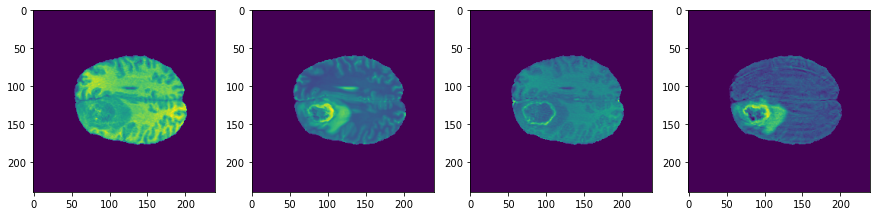

In [8]:
batch = val_dataset[920]#val_dataset[2010]
print(batch['target'])
logits = model.net(batch['image'].unsqueeze(0))[0]
print(logits)

fig, ax = plt.subplots(ncols=4, figsize=(15, 7))
for i in range(4):
    ax[i].imshow(batch['image'][i])
plt.show()

In [9]:
integrated_gradients = IntegratedGradients(model.net)
attributions_ig = integrated_gradients.attribute(batch['image'].unsqueeze(0), target=1, n_steps=200)

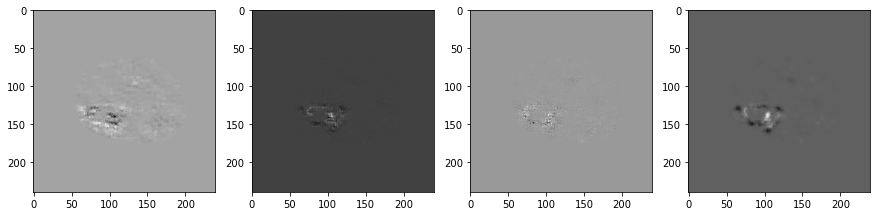

In [10]:
fig, ax = plt.subplots(ncols=4, figsize=(15, 7))
for i in range(4): 
    ax[i].imshow(attributions_ig[0,i], cmap=plt.cm.gray)
plt.show()

In [11]:
noise_tunnel = NoiseTunnel(integrated_gradients)
attributions_ig_nt = noise_tunnel.attribute(batch['image'].unsqueeze(0), target=1,
                                            nt_samples=10, nt_type='smoothgrad_sq')

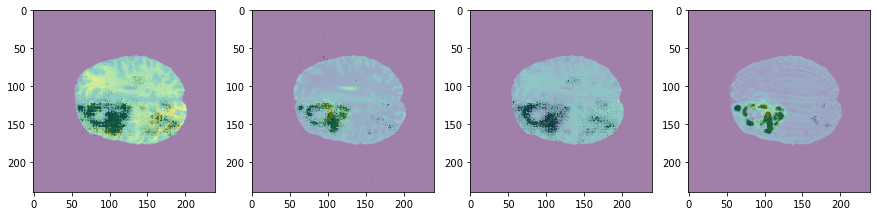

In [12]:
fig, ax = plt.subplots(ncols=4, figsize=(15, 7))
for i in range(4):
    ax[i].imshow(batch['image'][i])
    ax[i].imshow(attributions_ig_nt[0,i], cmap=default_cmap, alpha=0.5)
plt.show()

# IntegratedGradients on our sampling

In [13]:
def show_grad_maps(model, inputs, name='unnamed'):
    integrated_gradients = IntegratedGradients(model)
    attributions_ig = integrated_gradients.attribute(inputs, target=1, n_steps=200)
    fig, ax = plt.subplots(ncols=4, figsize=(15, 7))
    for i in range(4): 
        ax[i].imshow(attributions_ig[0, i], cmap=plt.cm.gray)
    plt.show()
    noise_tunnel = NoiseTunnel(integrated_gradients)
    attributions_ig_nt = noise_tunnel.attribute(inputs, target=1, nt_samples=50, nt_type='smoothgrad_sq')
    fig, ax = plt.subplots(ncols=4, figsize=(15, 7))
    for i in range(4):
        ax[i].imshow(inputs[0, i])
        ax[i].imshow(attributions_ig_nt[0,i], cmap=default_cmap, alpha=0.5)
    plt.show()
    np.save(file='%s_inputs.npy' % name, arr=np.array(inputs), allow_pickle=False)
    np.save(file='%s_attrs.npy' % name, arr=np.array(attributions_ig_nt), allow_pickle=False)

In [14]:
from igs import Ft, IFt

# w_igs = torch.load('samplings_huber.pt')[-3].cpu()
w_igs = torch.load('samplings_bce.pt')[-3].cpu()

zm = torch.zeros(240).float()
zm[240//2 - int(16)//2 : 240//2 + int(16)//2] = 1
zm = zm.unsqueeze(1).unsqueeze(0).unsqueeze(0)

# model = BraTSClassifierHuber.load_from_checkpoint(
#     'logs/BraTSClassifierHuber/epoch=03-val_loss=0.216.ckpt', strict=False).eval().cuda()
model = BraTSClassifierBinary\
.load_from_checkpoint('logs/BraTSClassifierBinary/epoch=03-val_loss=0.238.ckpt', strict=False)\
.eval().cuda()

In [15]:
model.sampling = zm.cuda()
model.use_sampling = True
yt_zm, yp_zm = test_model(model, val_generator)

model.sampling = w_igs.unsqueeze(0).unsqueeze(3).cuda()
model.use_sampling = True
yt_w, yp_w = test_model(model, val_generator)
print('zm: ', f1_score(yt_zm, yp_zm), 'ours: ', f1_score(yt_w, yp_w))

zm:  0.862358776522458 ours:  0.8715091988565565


In [22]:
np.where((np.array(yp_zm) != np.array(yp_w)) & (np.array(yp_w) == 1) & (np.array(yt_w) == 1))[0]

array([  381,   502,   736,   786,  1208,  1209,  1498,  1499,  1573,
        1574,  1575,  1576,  1724,  1735,  1736,  2940,  2941,  2942,
        3096,  3097,  3098,  3903,  3905,  3906,  4032,  4107,  4843,
        4844,  4845,  4846,  4847,  4848,  4849,  5050,  5151,  5185,
        5186,  5187,  5188,  5601,  5602,  5603,  5604,  5719,  5720,
        5721,  5722,  5723,  6303,  6397,  6531,  6532,  6535,  6593,
        7275,  7276,  7534,  7535,  7536,  7537,  7576,  7577,  7578,
        7579,  7580,  7581,  7582,  7583,  7584,  8003,  8493,  8781,
        8925,  8965,  8966,  9492, 10028, 10029, 10072, 10180, 10775,
       11979, 12271, 12830, 12874, 12875, 12876, 13219, 13222, 13223,
       13225, 13226, 13227, 13228, 13229, 13230, 13235, 13412, 13413,
       15203, 15204, 15205])

381


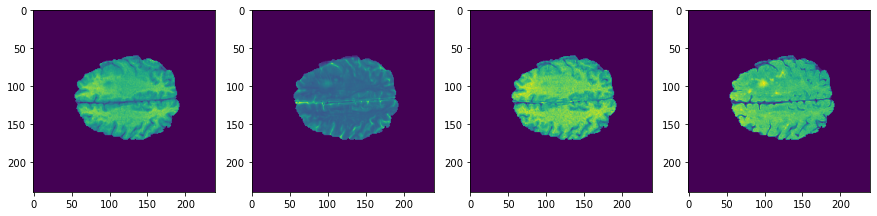

502


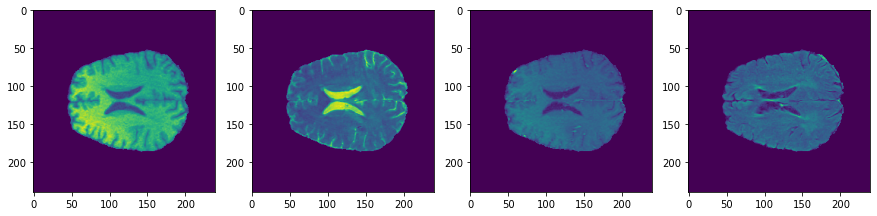

736


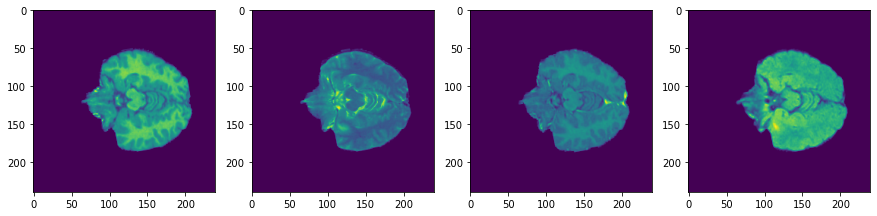

786


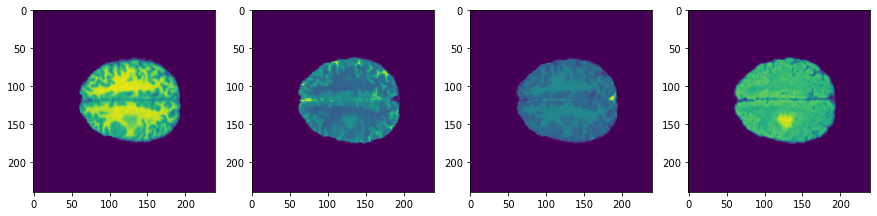

1208


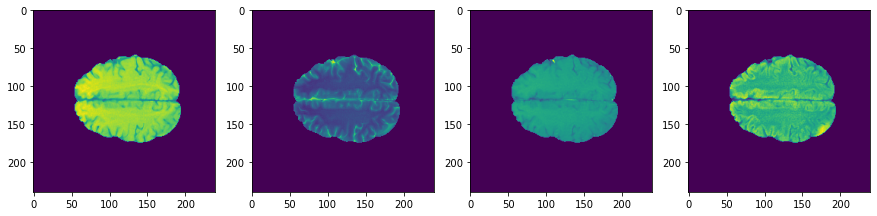

1209


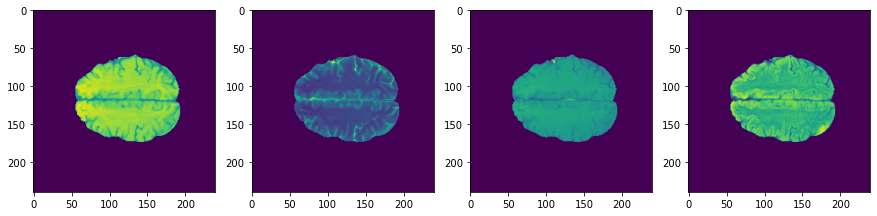

1498


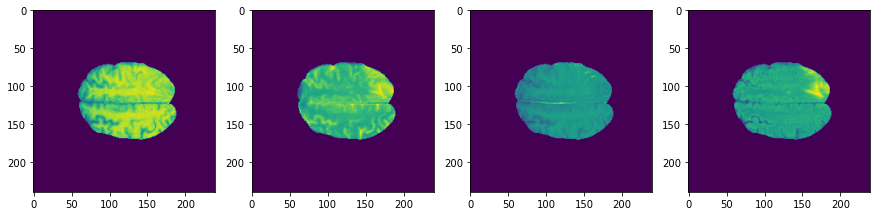

1499


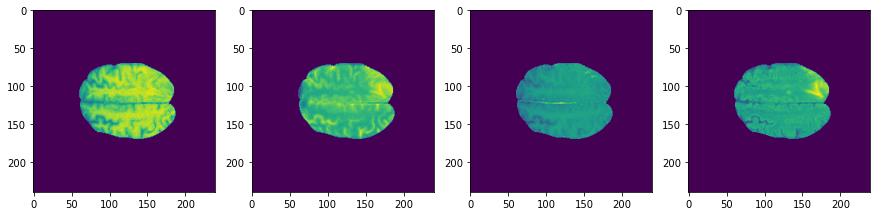

1573


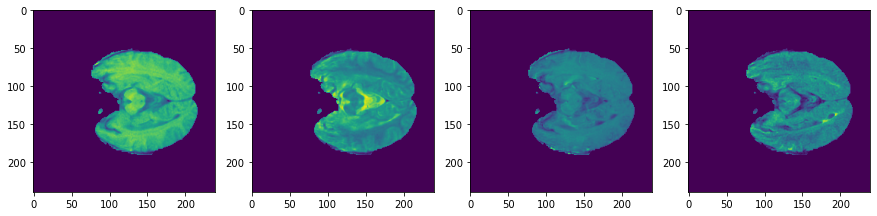

1574


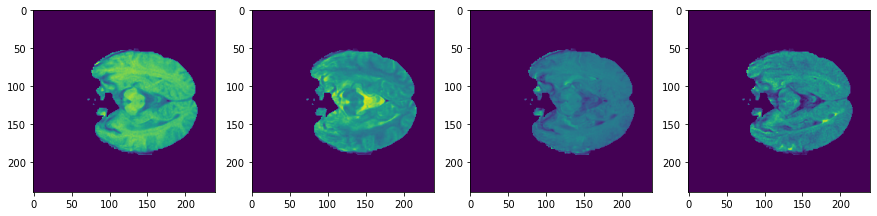

1575


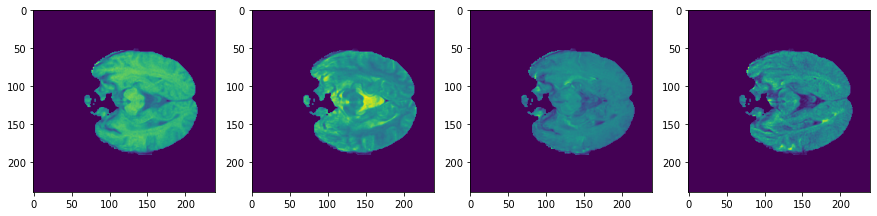

1576


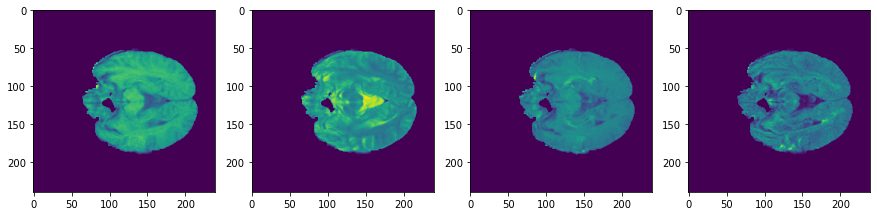

1724


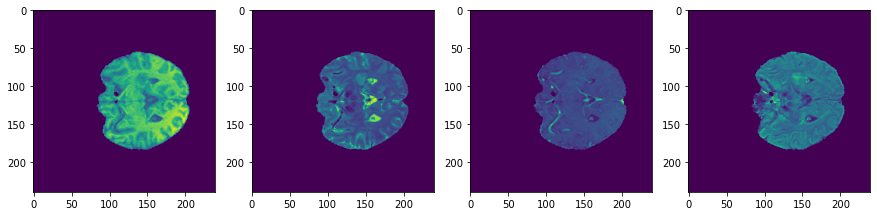

1735


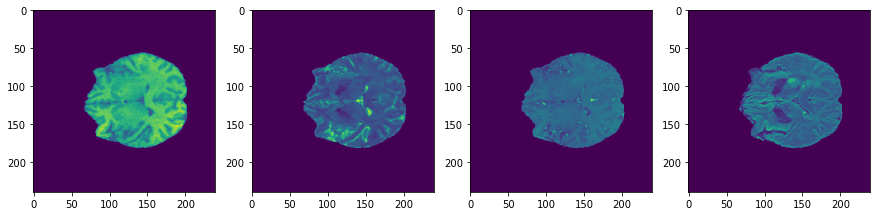

1736


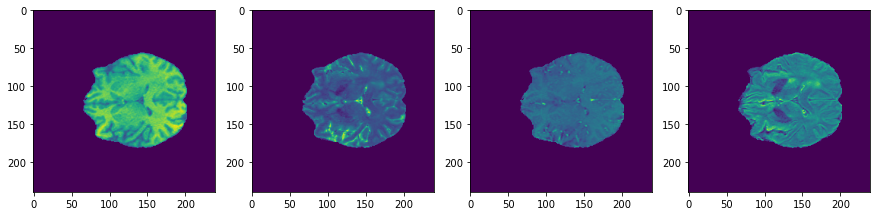

2940


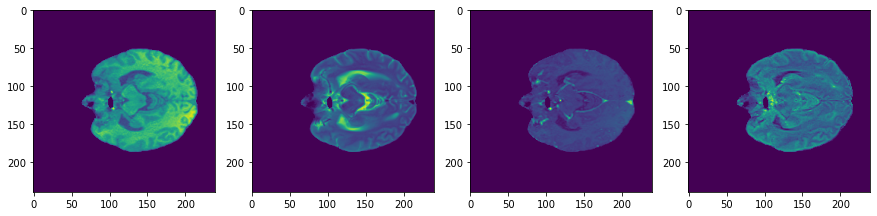

2941


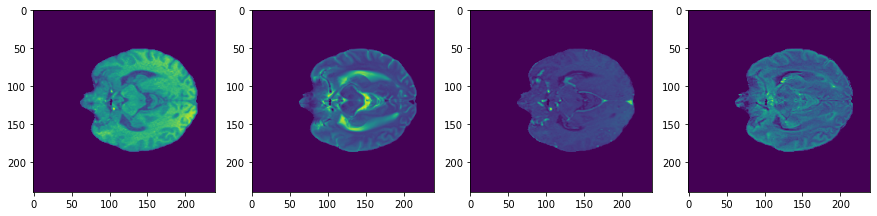

2942


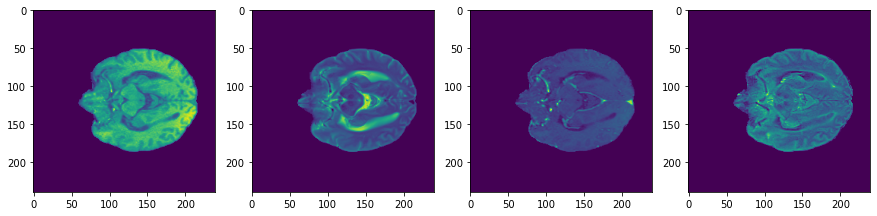

3096


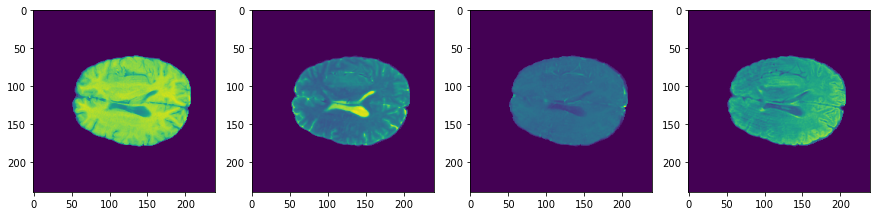

3097


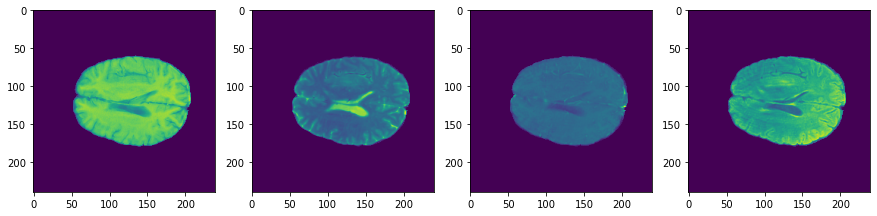

3098


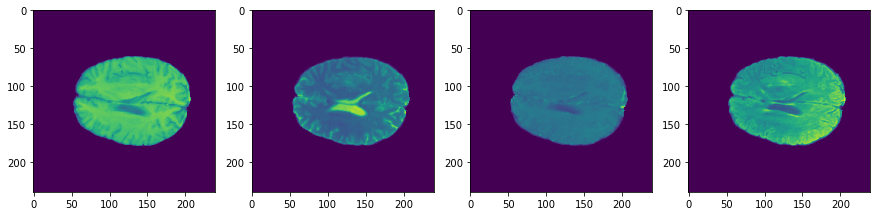

3903


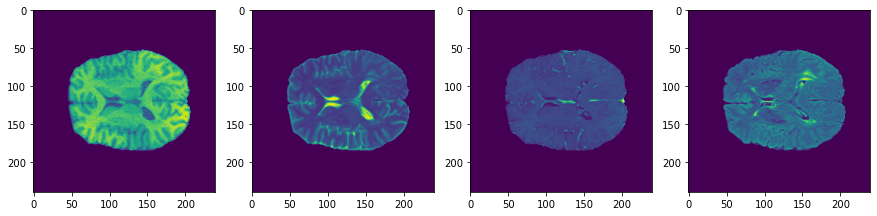

3905


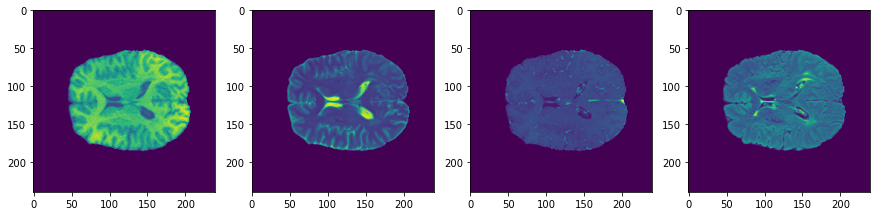

3906


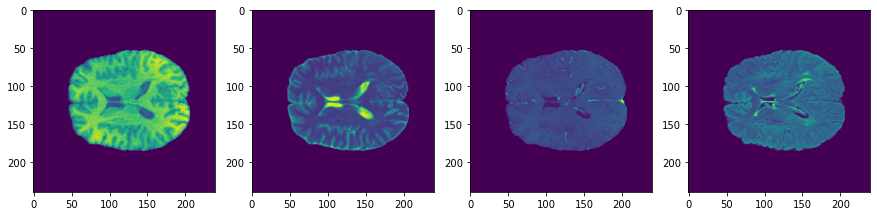

4032


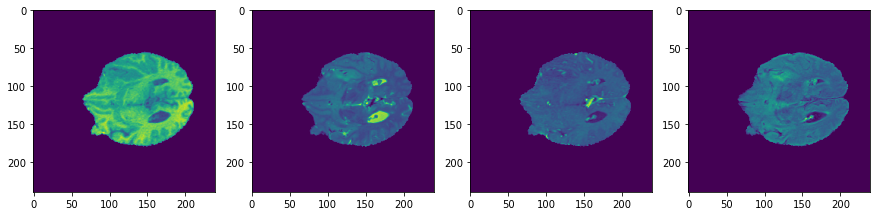

4107


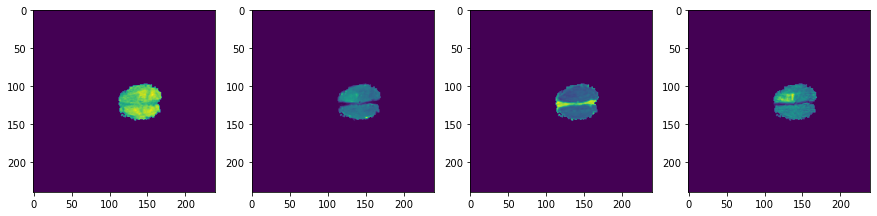

4843


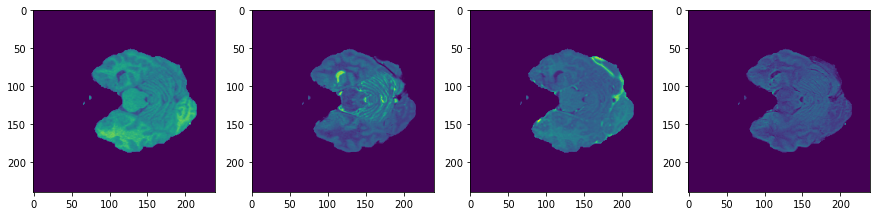

4844


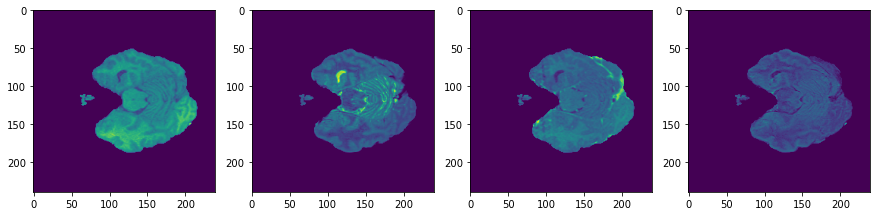

4845


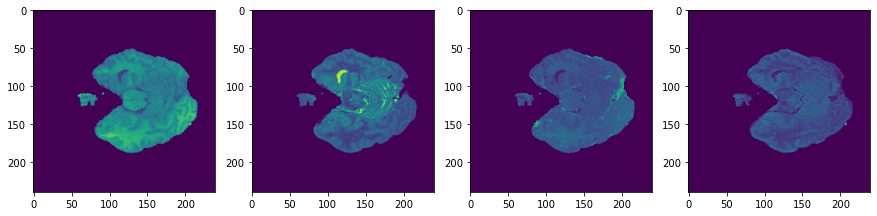

4846


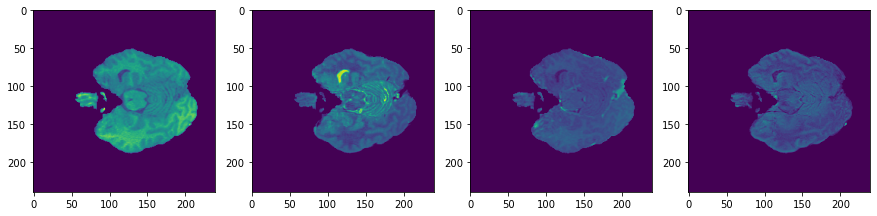

4847


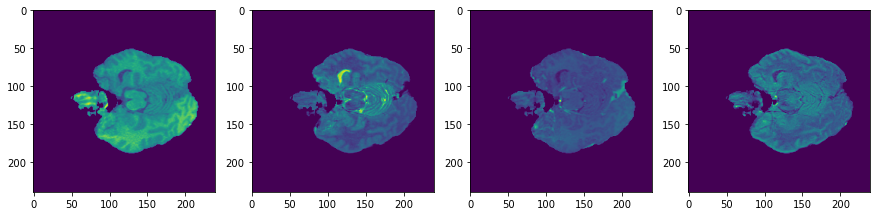

4848


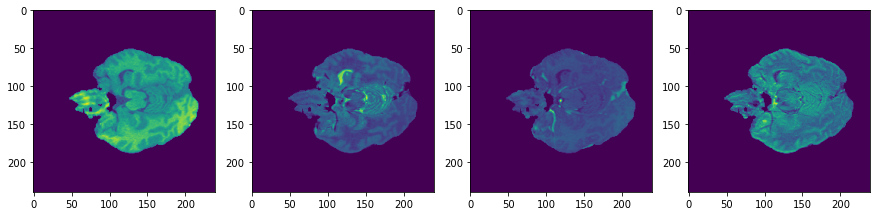

4849


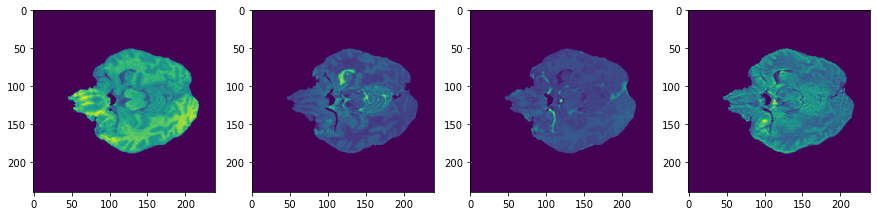

5050


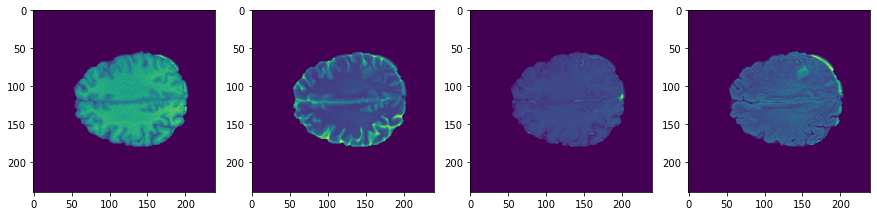

5151


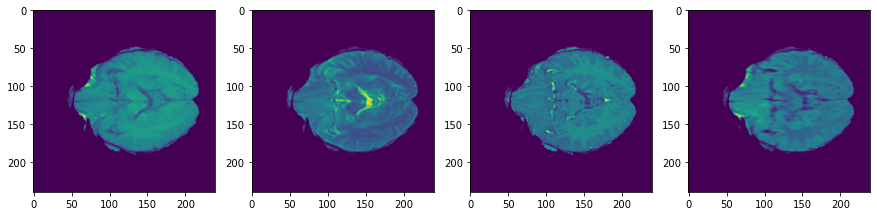

5185


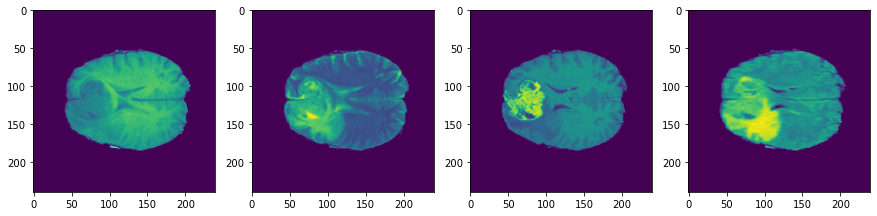

5186


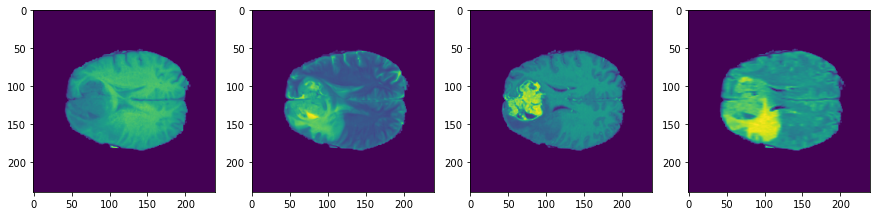

5187


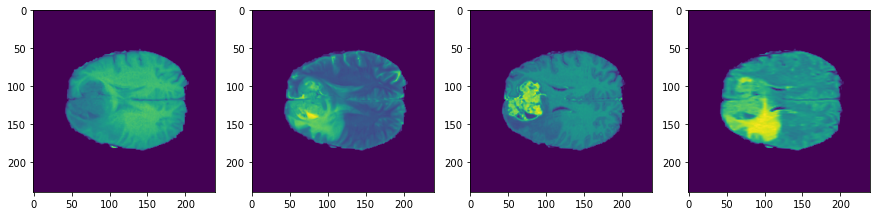

5188


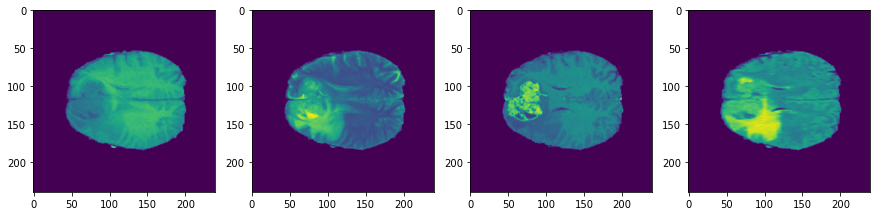

5601


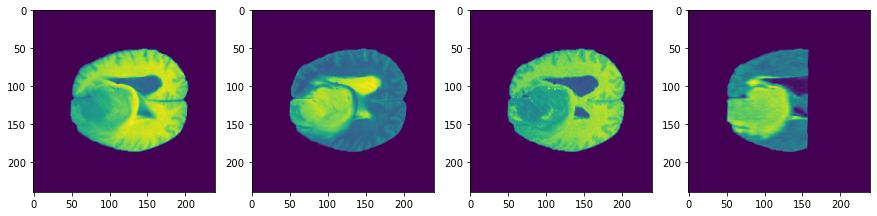

5602


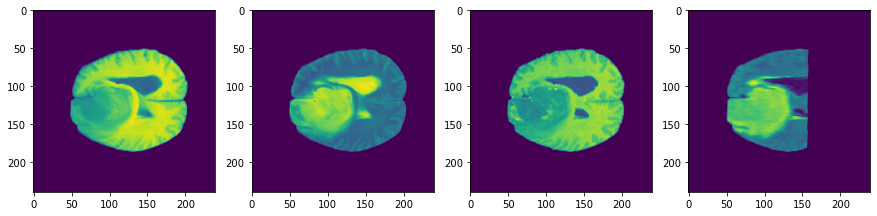

5603


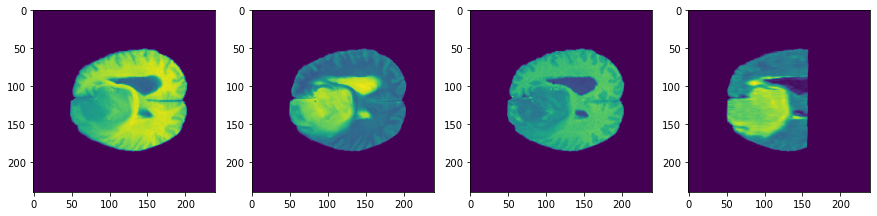

5604


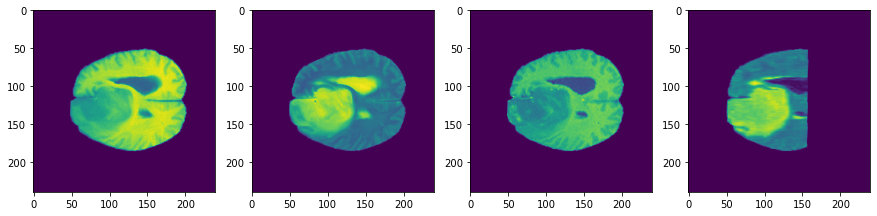

5719


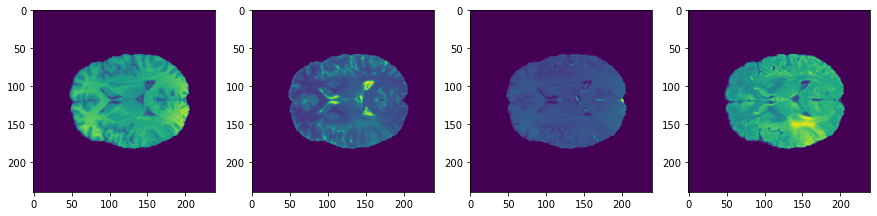

5720


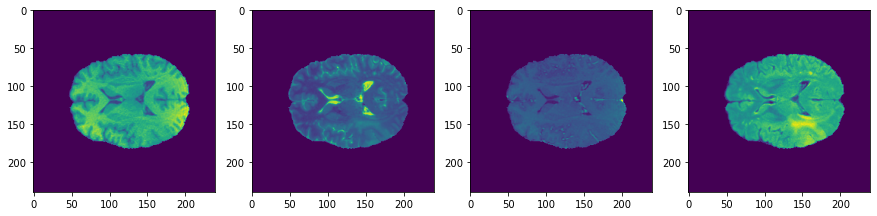

5721


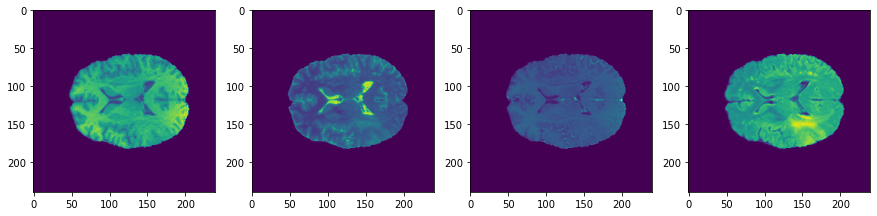

5722


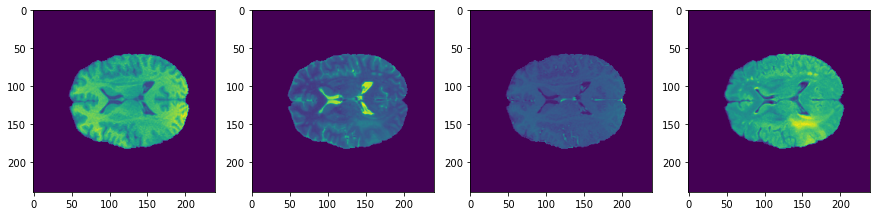

5723


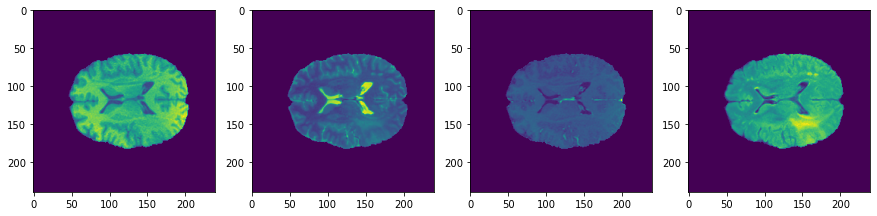

6303


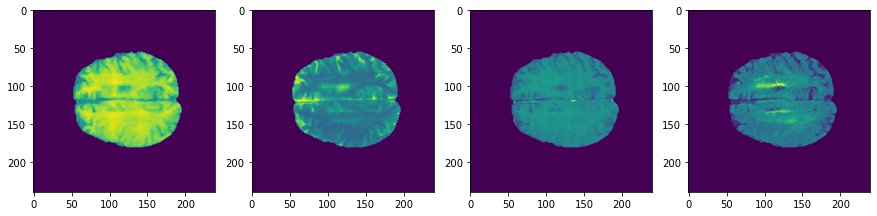

6397


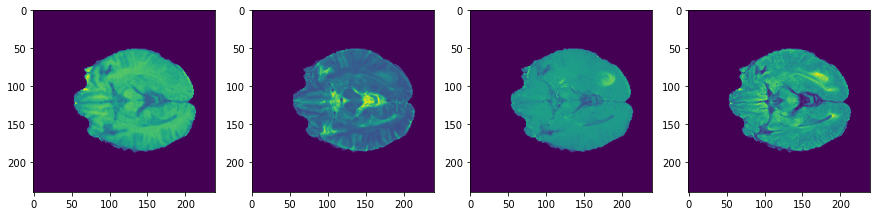

6531


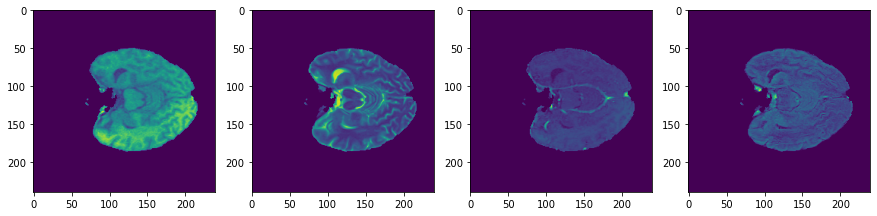

6532


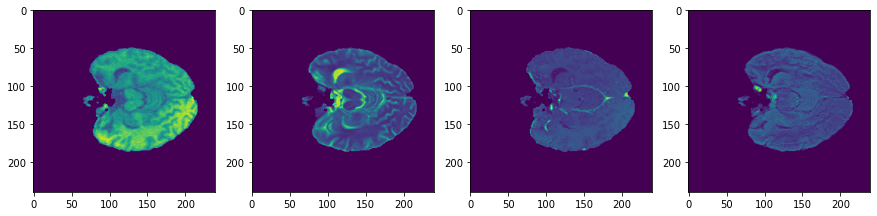

6535


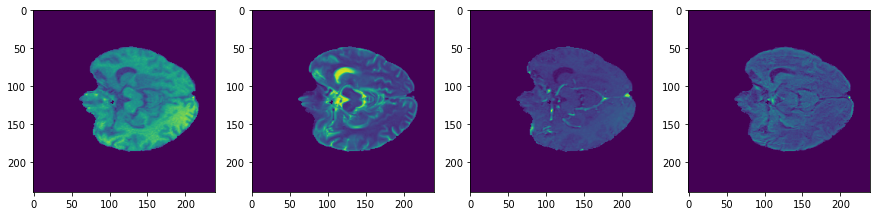

6593


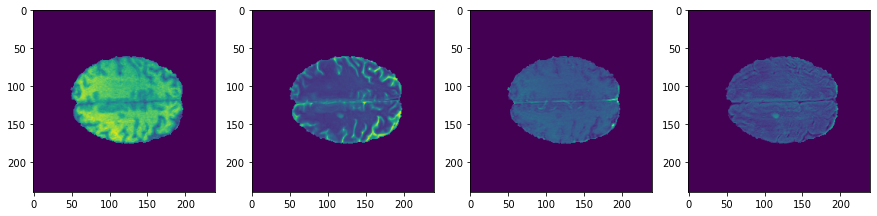

7275


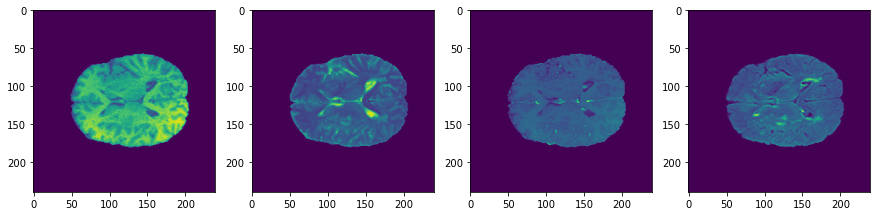

7276


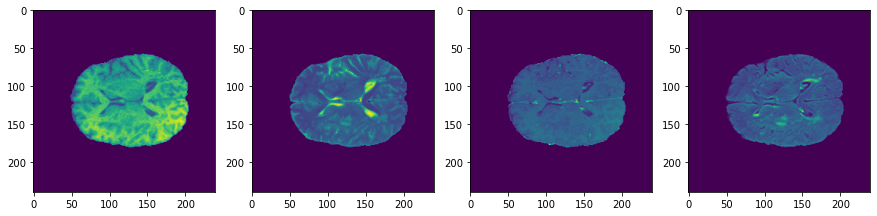

7534


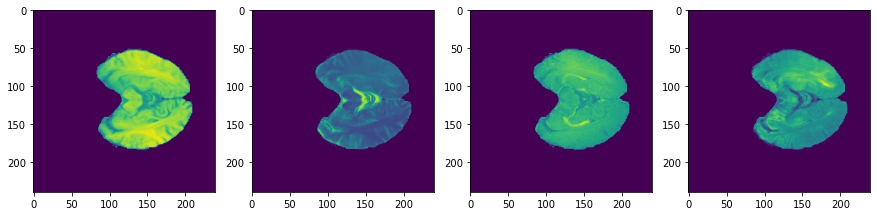

7535


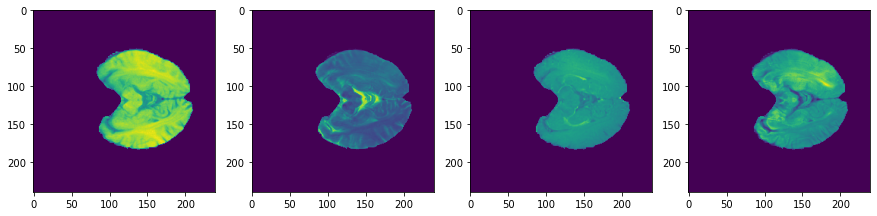

7536


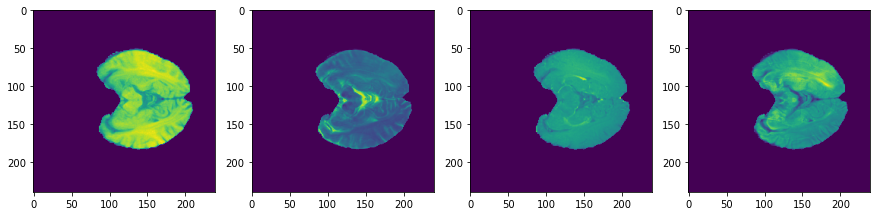

7537


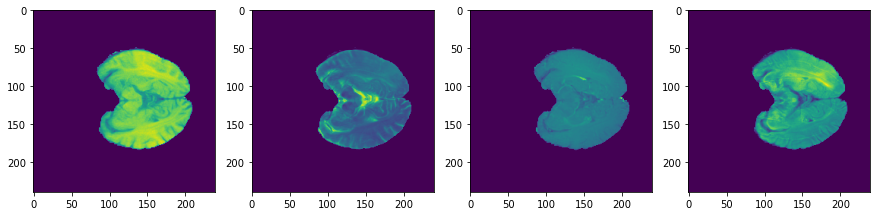

7576


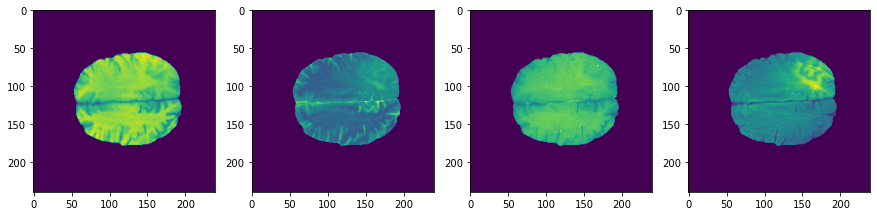

7577


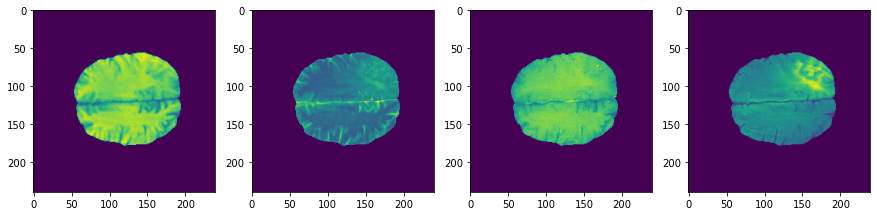

7578


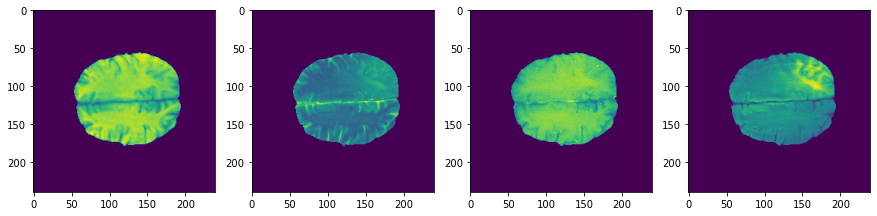

7579


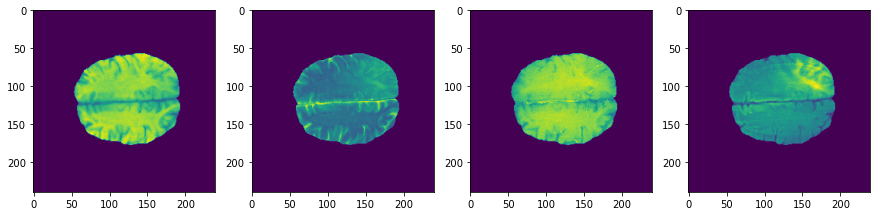

7580


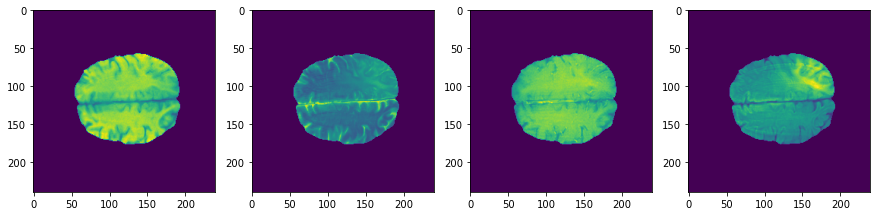

7581


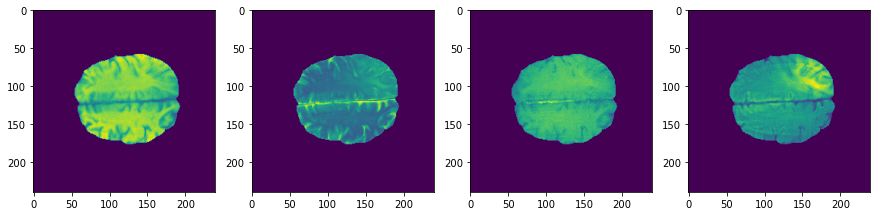

7582


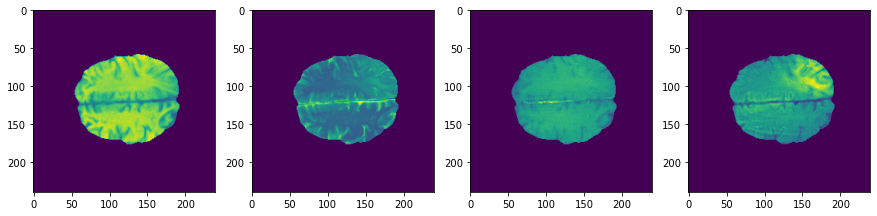

7583


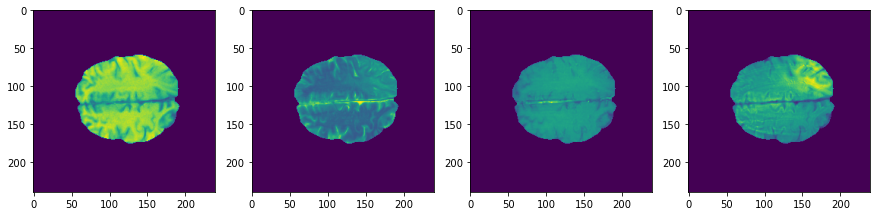

7584


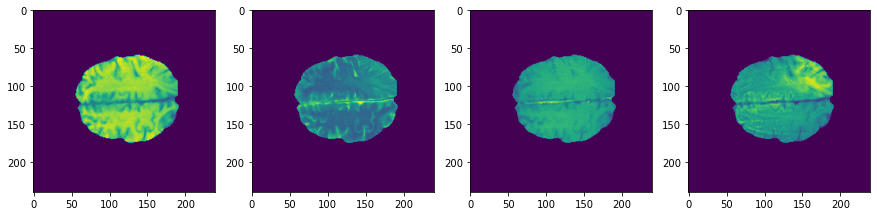

8003


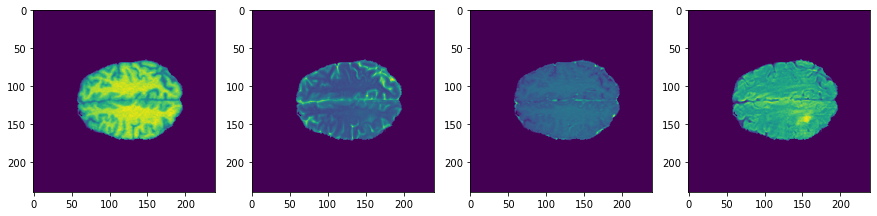

8493


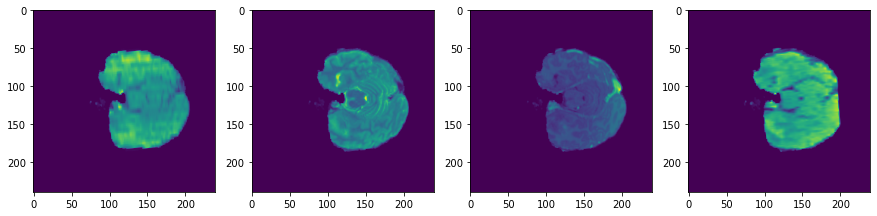

8781


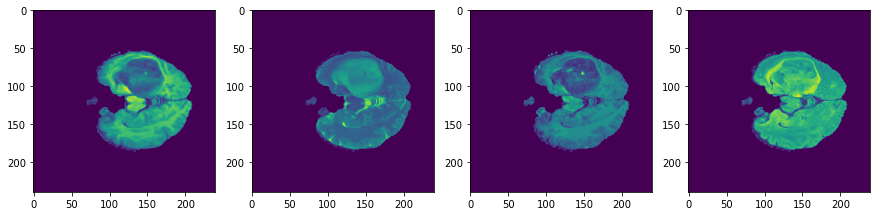

8925


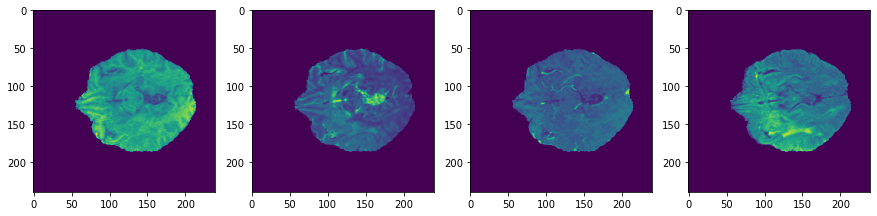

8965


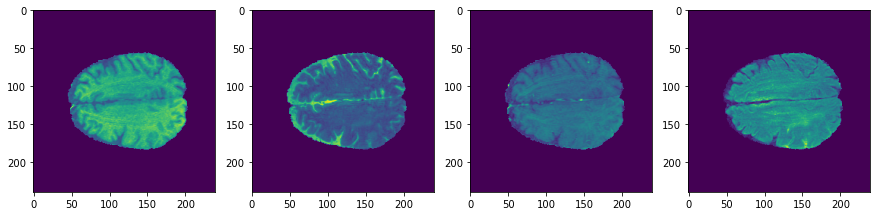

8966


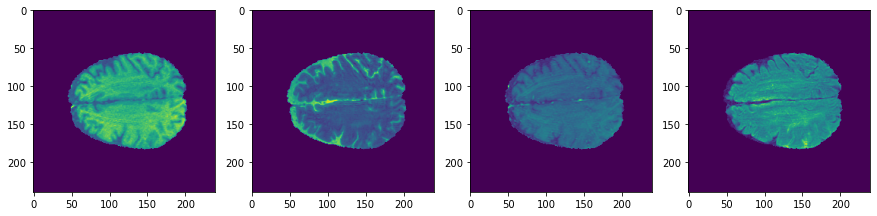

9492


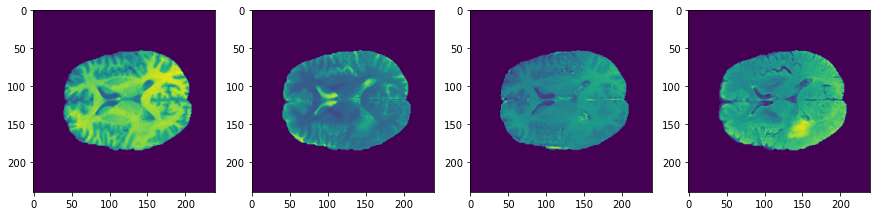

10028


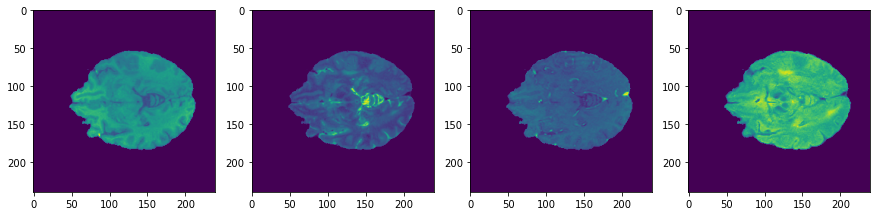

10029


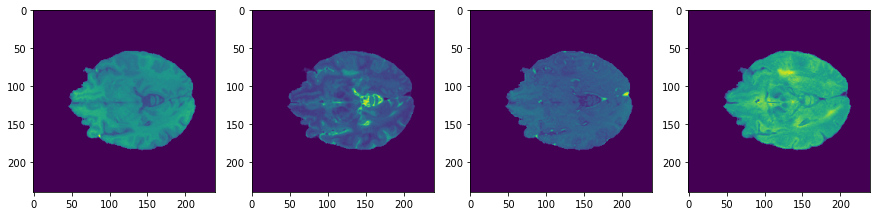

10072


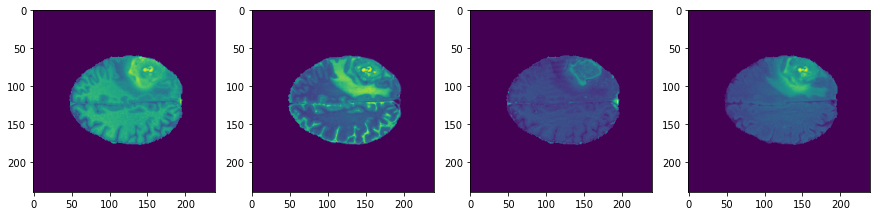

10180


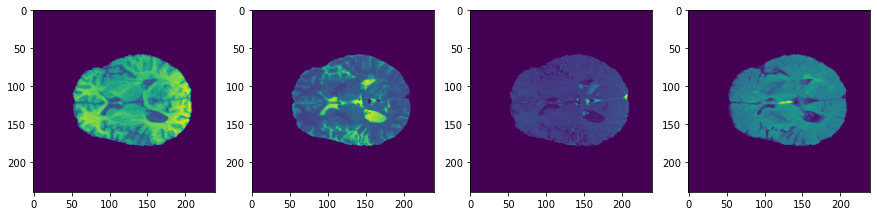

10775


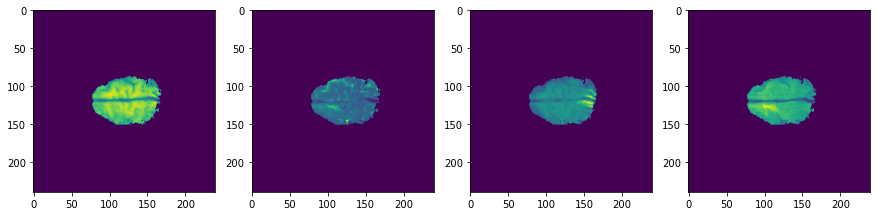

11979


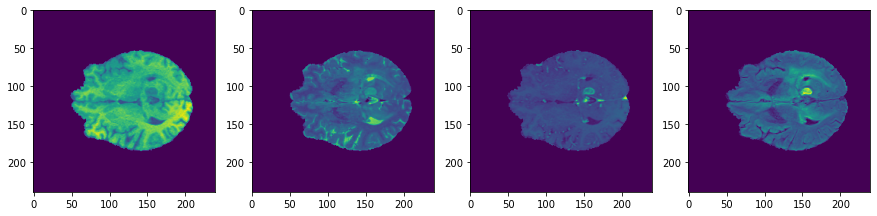

12271


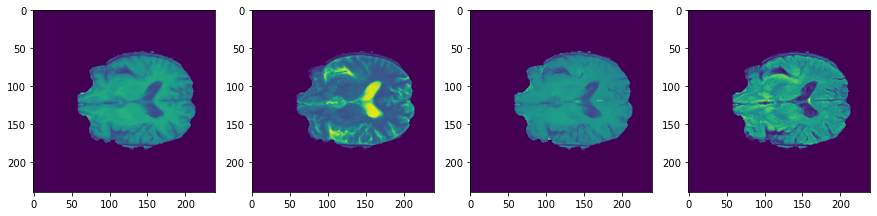

12830


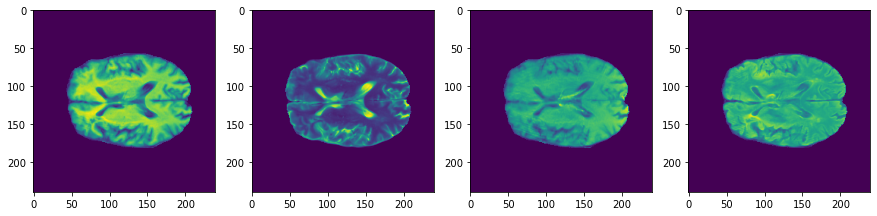

12874


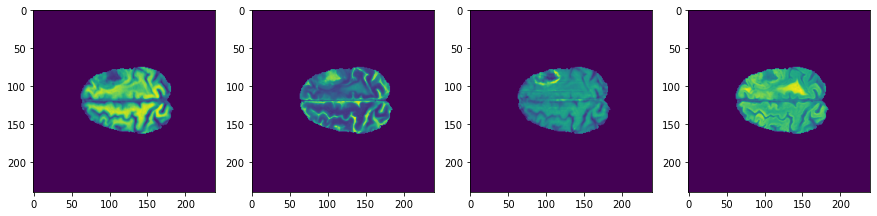

12875


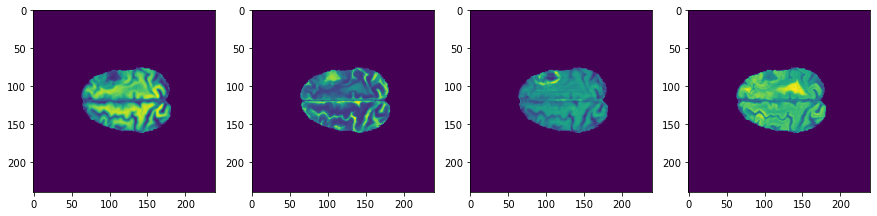

12876


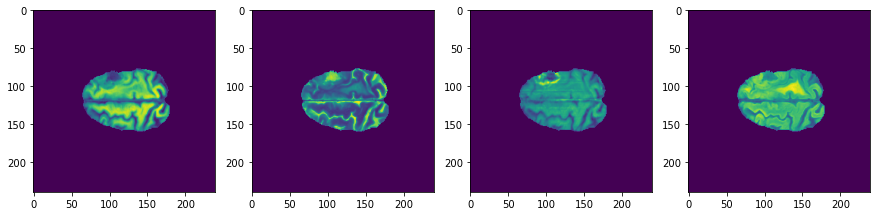

13219


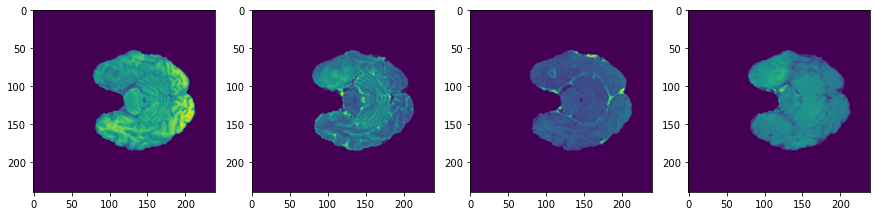

13222


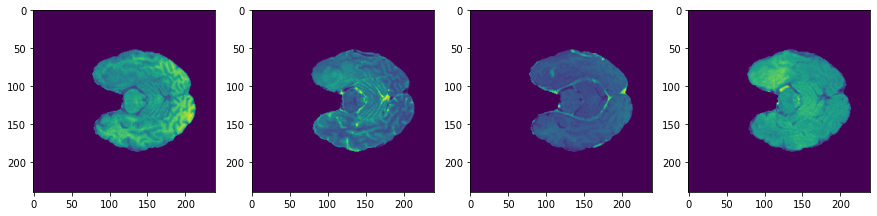

13223


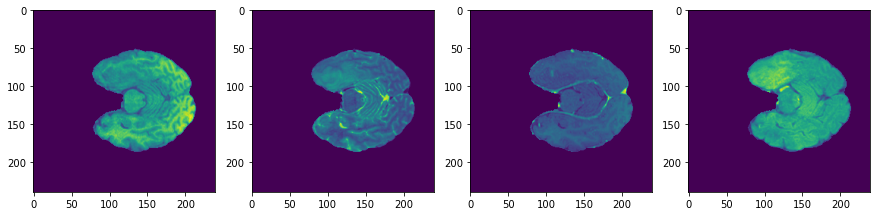

13225


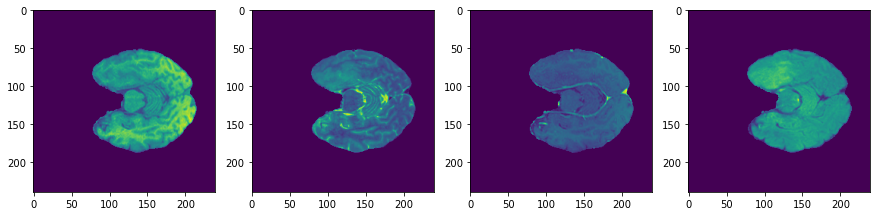

13226


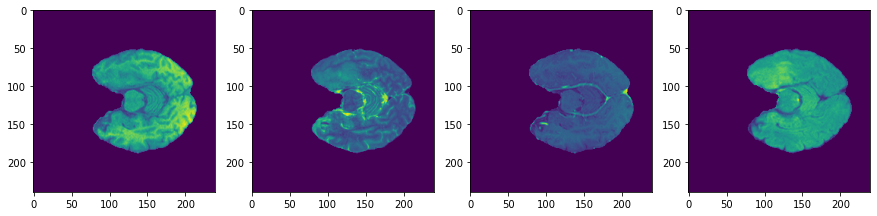

13227


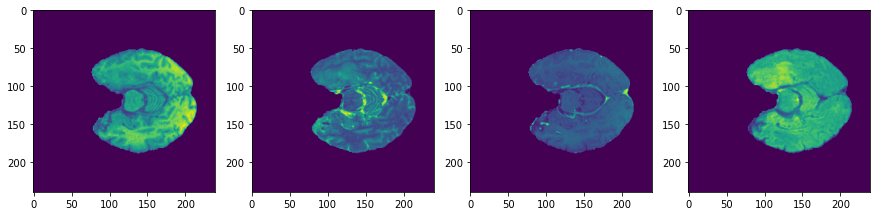

13228


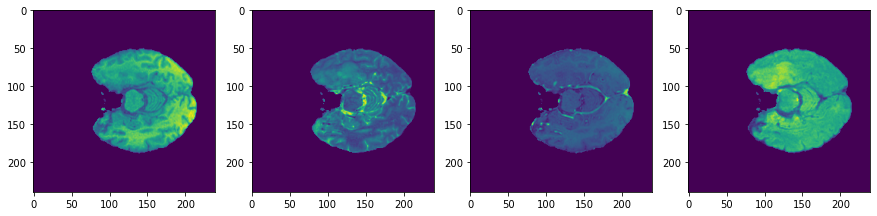

13229


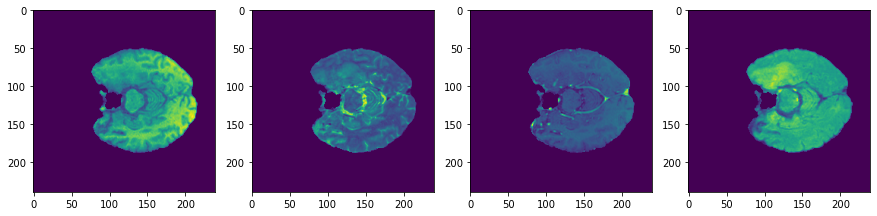

13230


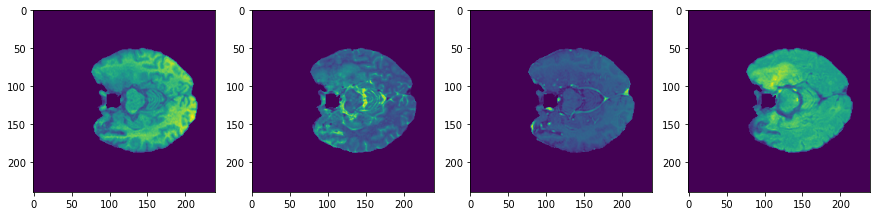

13235


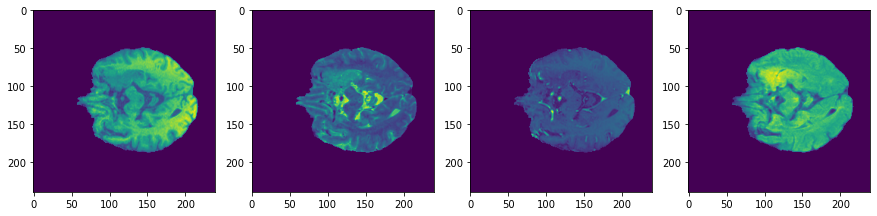

13412


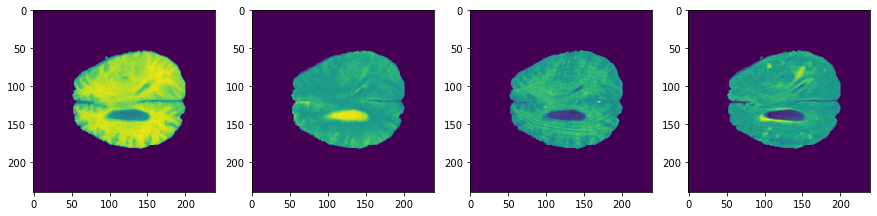

13413


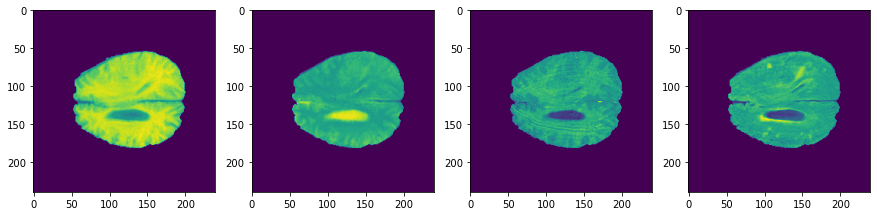

15203


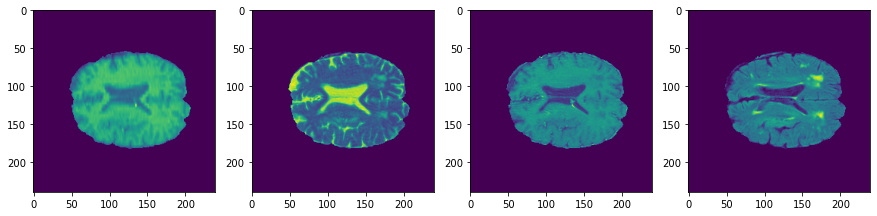

15204


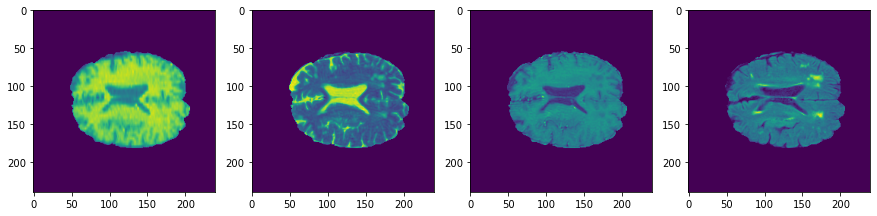

15205


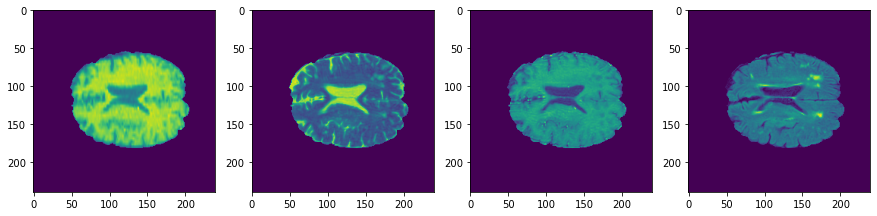

In [24]:
for i in np.where((np.array(yp_zm) != np.array(yp_w)) & (np.array(yp_w) == 1) & (np.array(yt_w) == 1))[0]:
    batch = val_dataset[i]
    print(i)
    fig, ax = plt.subplots(ncols=4, figsize=(15, 7))
    for i in range(4):
        ax[i].imshow(batch['image'][i])
    plt.show()

In [25]:
# model = BraTSClassifierHuber.load_from_checkpoint(
#     'logs/BraTSClassifierHuber/epoch=03-val_loss=0.216.ckpt', strict=False).eval()
model = BraTSClassifierBinary\
.load_from_checkpoint('logs/BraTSClassifierBinary/epoch=03-val_loss=0.238.ckpt', strict=False).eval()

tensor(1)
tensor([0.4163, 0.1496], grad_fn=<SelectBackward>)


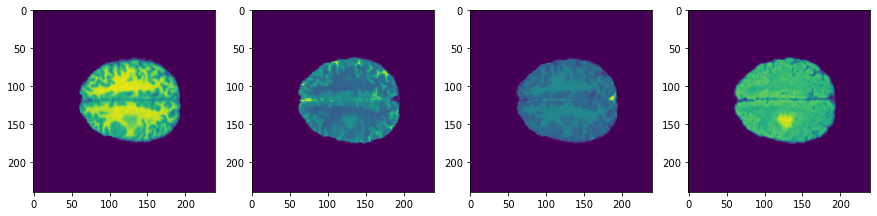

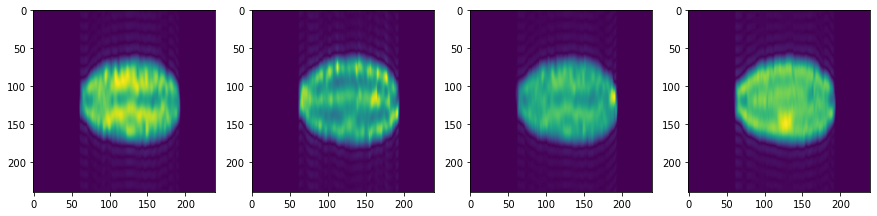

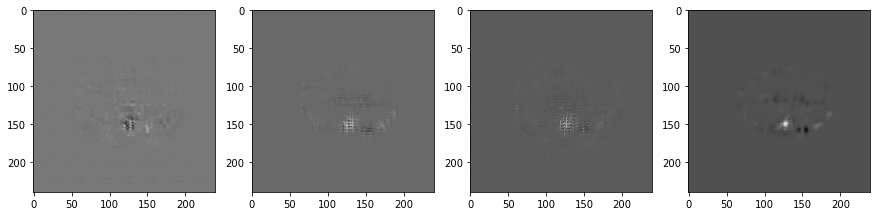

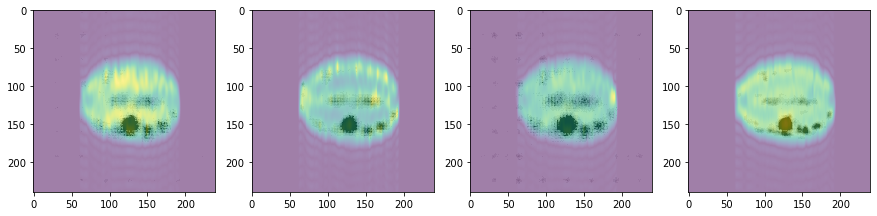

In [26]:
batch = val_dataset[786]
print(batch['target'])

img = batch['image'].unsqueeze(0)
mean = batch['mean'].unsqueeze(0)
std = batch['std'].unsqueeze(0)
ks = Ft(img * std + mean)
img = (IFt(ks * zm).abs() - mean) / (std + 1e-11)
logits = model.net(img)[0]
print(logits)
fig, ax = plt.subplots(ncols=4, figsize=(15, 7))
for i in range(4):
    ax[i].imshow(batch['image'][i])
plt.show()
fig, ax = plt.subplots(ncols=4, figsize=(15, 7))
for i in range(4):
    ax[i].imshow(img[0, i])
plt.show()

show_grad_maps(model.net, img)

tensor(1)
tensor([-0.7218,  1.1933], grad_fn=<SelectBackward>)


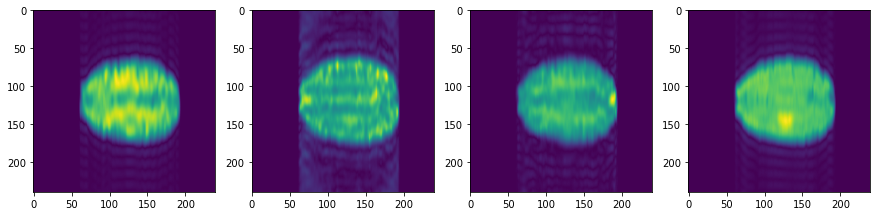

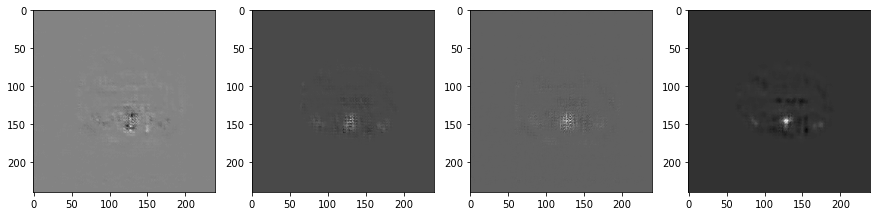

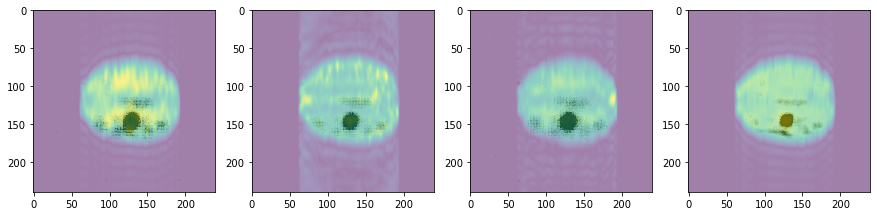

In [27]:
print(batch['target'])

img = batch['image'].unsqueeze(0)
mean = batch['mean'].unsqueeze(0)
std = batch['std'].unsqueeze(0)
ks = Ft(img * std + mean)
img = (IFt(ks * w_igs.unsqueeze(0).unsqueeze(3)).abs() - mean) / (std + 1e-11)
logits = model.net(img)[0]
print(logits)
fig, ax = plt.subplots(ncols=4, figsize=(15, 7))
for i in range(4):
    ax[i].imshow(img[0, i])
plt.show()

show_grad_maps(model.net, img, name='igs')

tensor(1)
tensor([-1.5318,  1.9326], grad_fn=<SelectBackward>)


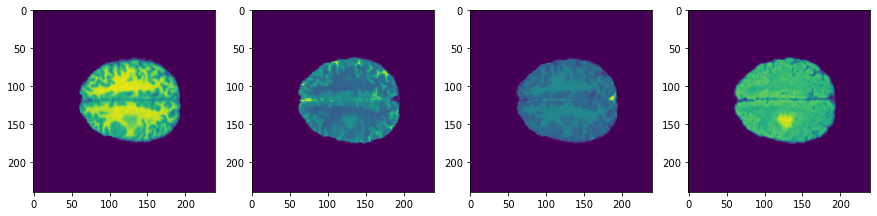

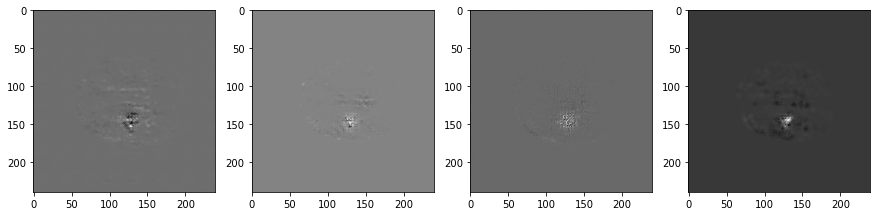

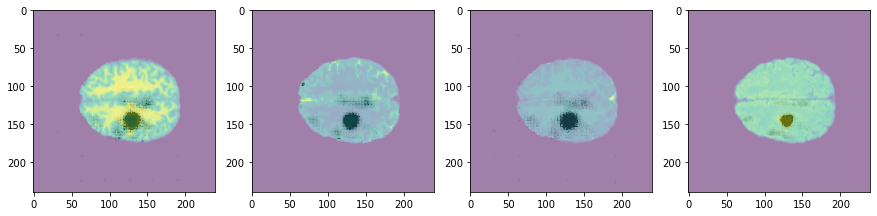

In [33]:
print(batch['target'])

img = batch['image'].unsqueeze(0)
mean = batch['mean'].unsqueeze(0)
std = batch['std'].unsqueeze(0)
ks = Ft(img * std + mean)
img = (IFt(ks).abs() - mean) / (std + 1e-11)
logits = model.net(img)[0]
print(logits)
fig, ax = plt.subplots(ncols=4, figsize=(15, 7))
for i in range(4):
    ax[i].imshow(img[0, i])
plt.show()

show_grad_maps(model.net, img, name='full')

In [35]:
z_img = np.load('unnamed_inputs.npy')
igs_img = np.load('igs_inputs.npy')
full_img = np.load('full_inputs.npy')
z_attrs = np.load('unnamed_attrs.npy')
igs_attrs = np.load('igs_attrs.npy')
full_attrs = np.load('full_attrs.npy')

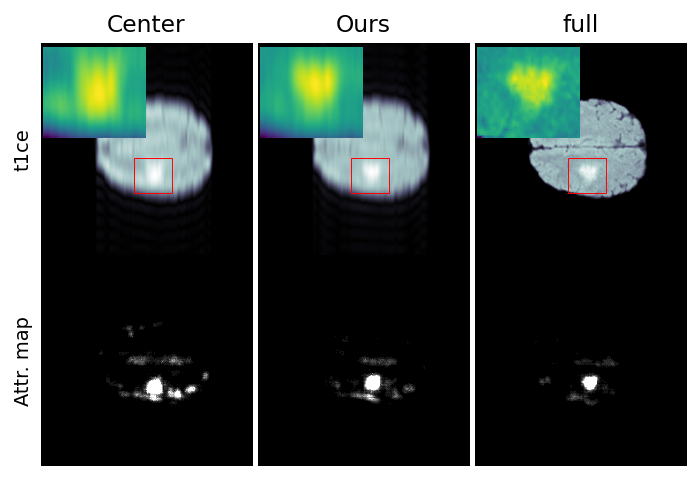

In [71]:
default_cmap = LinearSegmentedColormap.from_list('binary_r', 
                                                 [(0, '#000000'),
                                                  (0.05, '#ffffff'),
                                                  (1, '#ffffff')], N=256)

fig, ax = plt.subplots(ncols=3, nrows=2, figsize=(6, 4), dpi=140,
                       subplot_kw=dict(frameon=False, xticks=[], yticks=[]), 
                       gridspec_kw=dict(wspace=0.0, hspace=0.0))
ax[0,0].imshow(z_img[0,3], cmap=plt.cm.bone)
ax[1,0].imshow(z_attrs[0,3], cmap=default_cmap)
ax[0,0].set_title('Center')
ax[0,1].imshow(igs_img[0,3], cmap=plt.cm.bone)
ax[1,1].imshow(igs_attrs[0,3], cmap=default_cmap)
ax[0,1].set_title('Ours')
ax[0,2].imshow(full_img[0,3], cmap=plt.cm.bone)
ax[1,2].imshow(full_attrs[0,3], cmap=default_cmap)
ax[0,2].set_title('full')

for i in range(3):
    im = plt.matplotlib.offsetbox.OffsetImage(ax[0,i].images[0].get_array().data[130:130+39,105:105+44], zoom=1.2)
    rect = plt.matplotlib.patches.Rectangle((105, 130), 44, 39, linewidth=0.5, edgecolor='r', facecolor='none')
    im.image.axes = ax[0,i]
    ab = plt.matplotlib.offsetbox.AnnotationBbox(
        im, (0, 0),
        xybox=(60., 55.),
        pad=0.2,
        frameon=False,
    )
    ax[0,i].add_artist(ab)
    ax[0,i].add_patch(rect)
ax[0,0].set_ylabel('t1ce')
ax[1,0].set_ylabel('Attr. map')
plt.show()